# Выводы по проведенному сравнению алгоритмов non-blind deconvolution и нейросетевых моделей.

## Референсные значения метрик из статей + детали имплементации

### USRNET

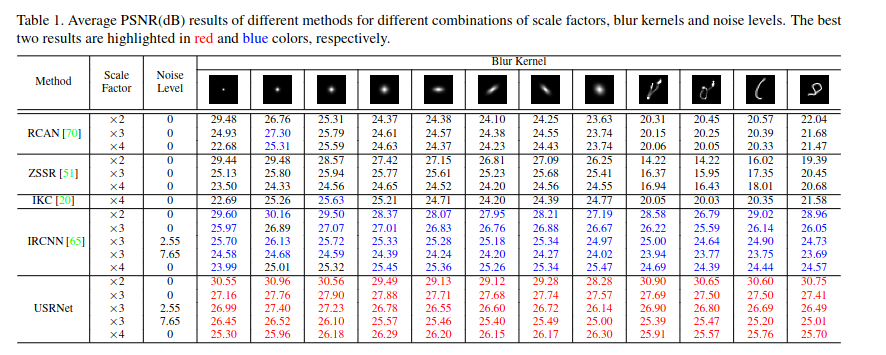

Код создания датасета: https://github.com/cszn/KAIR/blob/master/data/dataset_usrnet.py

Загружают uint8 sRGB изображение, сворачивают его с PSF, не переводя в линейное пространство

### DWDN

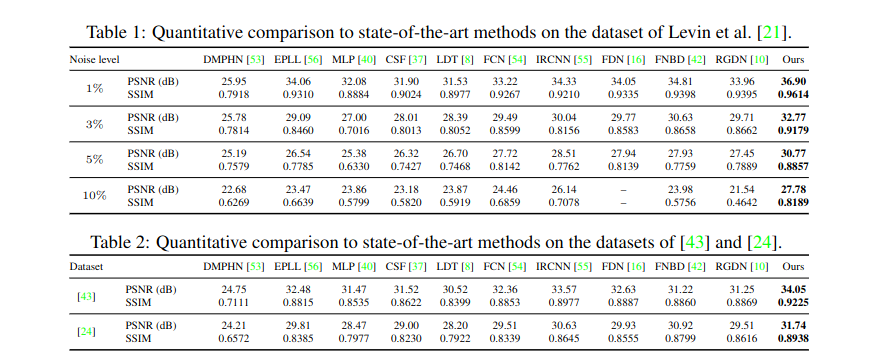

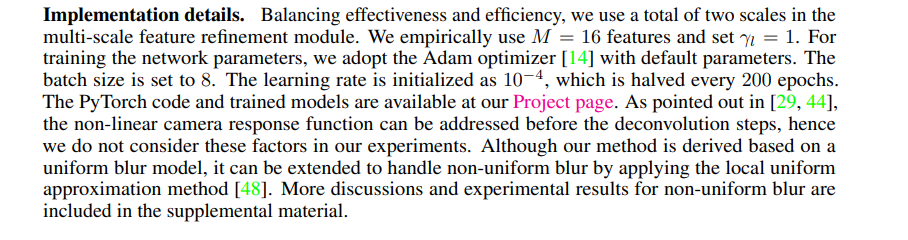

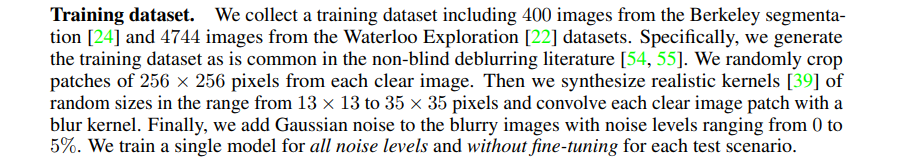

### KERUNC

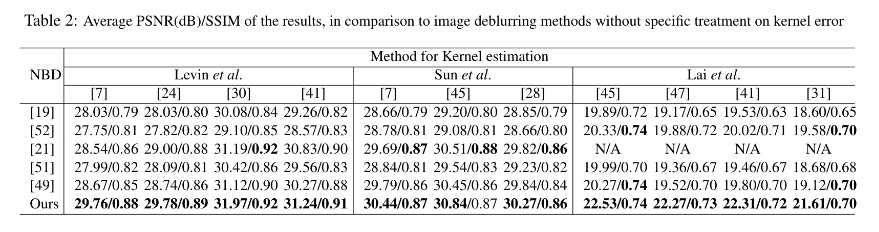

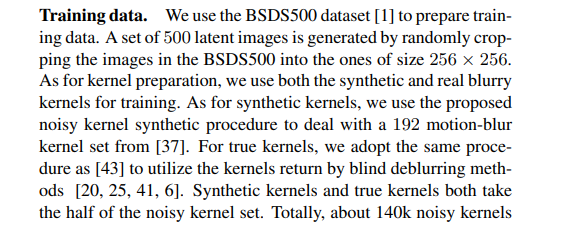

Для повышения робастности модели к ошибкам в ядре размытия используются подходы как на основе архитектуры, так и аугментация тренировочной выборки.

## Код для подключения к БД и визуализаций

In [1]:
%load_ext sql

In [2]:
%sql sqlite:////home/chaganovaob/edu/non-blind-deconvolution-benchmark/results/metrics.db

'Connected: @/home/chaganovaob/edu/non-blind-deconvolution-benchmark/results/metrics.db'

In [3]:
import warnings
warnings.filterwarnings('ignore', category=UserWarning)

In [4]:
import sys
sys.path.append('../src')

import typing as tp
from copy import copy

import numpy as np
import matplotlib.pyplot as plt
import torch
from omegaconf import OmegaConf

from constants import IMAGE_SIZE, MAX_UINT8, MAX_UINT16
from imutils import imread, rgb2gray, gray2gray3d, make_noised, center_crop, load_npy, imshow, imsshow
from data.convolution import convolve
from data.convertation import srgbf_to_linrgbf, float_to_uint16, linrrgb16_to_srgb8, uint16_to_uint8
from deconv.classic.wiener.wiener import wiener_gray
from deconv.neural.usrnet.predictor import USRNetPredictor
from deconv.neural.dwdn.predictor import DWDNPredictor
from deconv.neural.kerunc.predictor import KerUncPredictor
from deconv.neural.kerunc.psf_distorter import PSFDistorter
from metrics import psnr, ssim

plt.gray()

np.random.seed(8)


def get_max_pixel(discretization: tp.Literal['linrgb_float', 'linrgb_16bit', 'linrgb_8bit', 'srgb_8bit']):
    if discretization == 'linrgb_float':
        return 1
    elif discretization == 'linrgb_16bit':
        return MAX_UINT16
    elif discretization in ['linrgb_8bit', 'srgb_8bit']:
        return MAX_UINT8


def get_image_psf(
    image_path: str,
    psf_path: str,
    is_noised: bool,
    discretization: tp.Literal['linrgb_float', 'linrgb_16bit', 'linrgb_8bit', 'srgb_8bit'],
) -> tp.Tuple[np.array, np.array, np.array, np.array]:
    """Returns GRAY image in specified discretization"""

    if not image_path.endswith('.png'):
        raise ValueError('Supports only png images')

    image = imread(image_path)
    image = center_crop(image, IMAGE_SIZE, IMAGE_SIZE)
    if image.ndim == 3:
        image = rgb2gray(image)
    image = srgbf_to_linrgbf(image)  # convert from float sRGB to linRGB

    psf = load_npy(psf_path, key='psf')

    mu = 0
    sigma = 0.01

    # blurred
    blurred = convolve(image, psf)
    blurred_3d = gray2gray3d(blurred)

    if is_noised:
        blurred = make_noised(blurred, mu=mu, sigma=sigma)
        blurred_3d = make_noised(blurred_3d, mu=mu, sigma=sigma)
    
    if discretization == 'linrgb_float':
        return image, psf, blurred, blurred_3d
    
    image = float_to_uint16(image)
    blurred = float_to_uint16(blurred)
    blurred_3d = float_to_uint16(blurred_3d)

    if discretization == 'linrgb_16bit':
        return image, psf, blurred, blurred_3d

    if discretization == 'linrgb_8bit':
        image = uint16_to_uint8(image)
        blurred = uint16_to_uint8(blurred)
        blurred_3d = uint16_to_uint8(blurred_3d)
        return image, psf, blurred, blurred_3d

    if discretization == 'srgb_8bit':
        image = linrrgb16_to_srgb8(image)
        blurred = linrrgb16_to_srgb8(blurred)
        blurred_3d = linrrgb16_to_srgb8(blurred_3d)
        return image, psf, blurred, blurred_3d


#############

def viz(
    image: np.array,
    psf: np.array,
    blurred: np.array,
    blurred_3d: np.array,
    models: dict,
    is_noised: bool,
    discretization: tp.Literal['linrgb_float', 'linrgb_16bit', 'linrgb_8bit', 'srgb_8bit'],
):
    num_cols = 3 if len(models) < 3 else (len(models))
    _, ax = plt.subplots(2, num_cols, figsize=(num_cols * 4, 8))

    max_pixel = get_max_pixel(discretization)

    ax[0, 0].imshow(psf)
    ax[0, 0].axis('off')
    ax[0, 0].set_title('PSF')

    ax[0, 1].imshow(blurred)
    ax[0, 1].axis('off')
    ax[0, 1].set_title('Blurred')

    ax[0, 2].imshow(image)
    ax[0, 2].axis('off')
    ax[0, 2].set_title(f'GT (float) | ssim: {ssim(image, blurred):.2f}, psnr: {psnr(image, blurred):.2f} (image <-> blurred)')

    if len(models) == 4:
        ax[0, 3].imshow(np.zeros((5, 5), dtype=np.float16), cmap='binary', vmin=0, vmax=1)
        ax[0, 3].axis('off')

    noise = 'noise' if is_noised else 'no_noise'
    for i, model_name in enumerate(models.keys()):
        model = models[model_name][noise] if model_name != 'wiener' else models[model_name]['noise']
        restored = (
            model((blurred_3d / max_pixel).astype(np.float32), psf)[..., 0]
            if model_name in ['usrnet', 'dwdn']
            else model((blurred / max_pixel).astype(np.float32), psf)
        )
        ax[1, i].imshow(restored)
        ax[1, i].axis('off')
        ax[1, i].set_title(f'{model_name} | ssim: {ssim((image / max_pixel).astype(np.float32), restored):.2f}, psnr: {psnr((image / max_pixel).astype(np.float32), restored):.2f}')
 

###################


def viz_split_noise(
    image: np.array,
    psf: np.array,
    blurred: np.array,
    noised_blurred: np.array,
    blurred_3d: np.array,
    noised_blurred_3d: np.array,
    models: dict,
    discretization: tp.Literal['linrgb_float', 'linrgb_16bit', 'linrgb_8bit', 'srgb_8bit'],
):
    num_cols = 3 if len(models) < 3 else (len(models))
    _, ax = plt.subplots(3, num_cols, figsize=(num_cols * 4, 3 * 4))

    max_pixel = get_max_pixel(discretization)

    ax[0, 0].imshow(psf)
    ax[0, 0].axis('off')
    ax[0, 0].set_title('PSF')

    ax[0, 1].imshow(blurred)
    ax[0, 1].axis('off')
    ax[0, 1].set_title('Blurred')

    ax[0, 2].imshow(image)
    ax[0, 2].axis('off')
    ax[0, 2].set_title(f'Ground truth | ssim: {ssim(image, blurred):.2f}, psnr: {psnr(image, blurred):.2f} (image <-> blurred)')

    if len(models) == 4:
        ax[0, 3].imshow(np.zeros((5, 5), dtype=np.float16), cmap='binary', vmin=0, vmax=1)
        ax[0, 3].axis('off')
    
    for i, model in enumerate(models.keys()):
        restored = (
            models[model]['no_noise']((blurred_3d / max_pixel).astype(np.float32), psf)[..., 0]
            if model in ['usrnet', 'dwdn']
            else models[model]['no_noise']((blurred / max_pixel).astype(np.float32), psf)
        )
        ax[1, i].imshow(restored)
        ax[1, i].axis('off')
        ax[1, i].set_title(f'{model} | ssim: {ssim(image / max_pixel, restored):.2f}, psnr: {psnr(image / max_pixel, restored):.2f}')

        restored = (
            models[model]['noise']((noised_blurred_3d / max_pixel).astype(np.float32), psf)[..., 0]
            if model in ['usrnet', 'dwdn']
            else models[model]['noise']((noised_blurred / max_pixel).astype(np.float32), psf)
        )
        ax[2, i].imshow(restored)
        ax[2, i].axis('off')
        ax[2, i].set_title(f'{model} | ssim: {ssim(image / max_pixel, restored):.2f}, psnr: {psnr(image / max_pixel, restored):.2f}')

###########################################

def viz_wiener_diff_params(
    image: np.array,
    psf: np.array,
    blurred: np.array,
    params: tp.List[dict],
):
    num_cols = 3 + len(params)
    _, ax = plt.subplots(1, num_cols, figsize=(num_cols * 6, 8))

    ax[0].imshow(psf)
    ax[0].axis('off')
    ax[0].set_title('PSF')

    ax[1].imshow(blurred)
    ax[1].axis('off')
    ax[1].set_title('Blurred')

    ax[2].imshow(image)
    ax[2].axis('off')
    ax[2].set_title(f'Ground truth | ssim: {ssim(image, blurred):.2f}, psnr: {psnr(image, blurred):.2f} (image <-> blurred)')
    
    for i, param in enumerate(params): 
        restored = wiener_gray(blurred, psf, **param, clip=True)
        ax[i + 3].imshow(restored)
        ax[i + 3].axis('off')
        ax[i + 3].set_title(f'{param} | ssim: {ssim(image, restored):.2f}, psnr: {psnr(image, restored):.2f}')
    

<Figure size 640x480 with 0 Axes>

In [5]:
config = OmegaConf.load('../configs/config_viz.yml')
cm = config.models

models = dict()

models['wiener'] = dict()
models['wiener']['noise'] = lambda image, psf: wiener_gray(image, psf, **cm.wiener_nonblind_noise.noise_params)
models['wiener']['no_noise'] = lambda image, psf: wiener_gray(image, psf, **cm.wiener_nonblind_noise.no_noise_params)

models['kerunc'] = dict()
models['kerunc']['noise'] = KerUncPredictor(**cm.kerunc.noise_params)
models['kerunc']['no_noise'] = KerUncPredictor(**cm.kerunc.no_noise_params)

models['usrnet'] = dict()
models['usrnet']['noise'] = USRNetPredictor(model_path=cm.usrnet.model_path, **cm.usrnet.noise_params)
models['usrnet']['no_noise'] = USRNetPredictor(model_path=cm.usrnet.model_path, **cm.usrnet.no_noise_params)

models['dwdn'] = dict()
models['dwdn']['noise'] = DWDNPredictor(model_path=cm.dwdn.model_path, **cm.dwdn.noise_params)
models['dwdn']['no_noise'] = DWDNPredictor(model_path=cm.dwdn.model_path, **cm.dwdn.no_noise_params)

nn_models = copy(models)
nn_models.pop('wiener', None)

{'noise': <function __main__.<lambda>(image, psf)>,
 'no_noise': <function __main__.<lambda>(image, psf)>}

Зафиксируем конфиги:

In [6]:
for key in config['models'].keys():
    print(key)
    print(config['models'][key])
    print()

wiener_blind_noise
{'gauss_blur': True, 'motion_blur': True, 'eye_blur': True, 'RGB': True, 'no_noise_params': {'balance': 0.001, 'clip': True}, 'noise_params': {'balance': 0.001, 'clip': True}}

wiener_nonblind_noise
{'gauss_blur': True, 'motion_blur': True, 'eye_blur': True, 'RGB': True, 'no_noise_params': {'balance': 1e-08, 'clip': True}, 'noise_params': {'balance': 0.005, 'clip': True}}

usrnet
{'gauss_blur': True, 'motion_blur': True, 'eye_blur': True, 'RGB': True, 'model_path': '../models/usrnet.pth', 'no_noise_params': {'scale_factor': 1, 'noise_level': 0, 'device': 'cpu'}, 'noise_params': {'scale_factor': 1, 'noise_level': 0.00784, 'device': 'cpu'}}

dwdn
{'gauss_blur': True, 'motion_blur': True, 'eye_blur': True, 'RGB': True, 'model_path': '../models/model_DWDN.pt', 'no_noise_params': {'n_levels': 2, 'scale': 0.5, 'device': 'cpu'}, 'noise_params': {'n_levels': 2, 'scale': 0.5, 'device': 'cpu'}}

kerunc
{'gauss_blur': True, 'motion_blur': True, 'eye_blur': True, 'RGB': False, '

## №1 На `motion blur` нейросетевые методы показывают лучшее качество и по метрикам, и визуально при всех трех типах дискретизации, и в условиях шума


- Винеровский фильтр выигрывает в единственном случае: на float-изображениях без шума (идеальный вариант). При этом отрыв только по метрикам, визуально качество восстановленных изображений не имеет заметных отличий. 

- В реалистичных условиях (с шумом и другим типом дискретизации) нейросети и по метрикам, и визуально лучше Винеровского фильтра, который допускает появление артефактов.

- Важно, что гиперпараметры Винеровского фильтра (`balance`) были оптимизированы под различные типы дискретизации, в то время как гипермараметры нейросетей -- нет.

### 1. Float без шума

#### Метрики

In [38]:
%%sql sqlite://

SELECT model, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_30_03
WHERE discretization == 'linrgb_float' AND noised == False AND blur_type == 'motion_blur'
GROUP BY model;

Done.


model,AVG(psnr),AVG(ssim)
dwdn,33.66,0.98
kerunc,32.11,0.97
usrnet,46.72,1.0
wiener_blind_noise,28.01,0.95
wiener_nonblind_noise,62.76,0.99


По метрикам Винер выигрывает со значительным перевесом на PSNR, но по SSIM разницы почти нет.

#### Иллюстрации

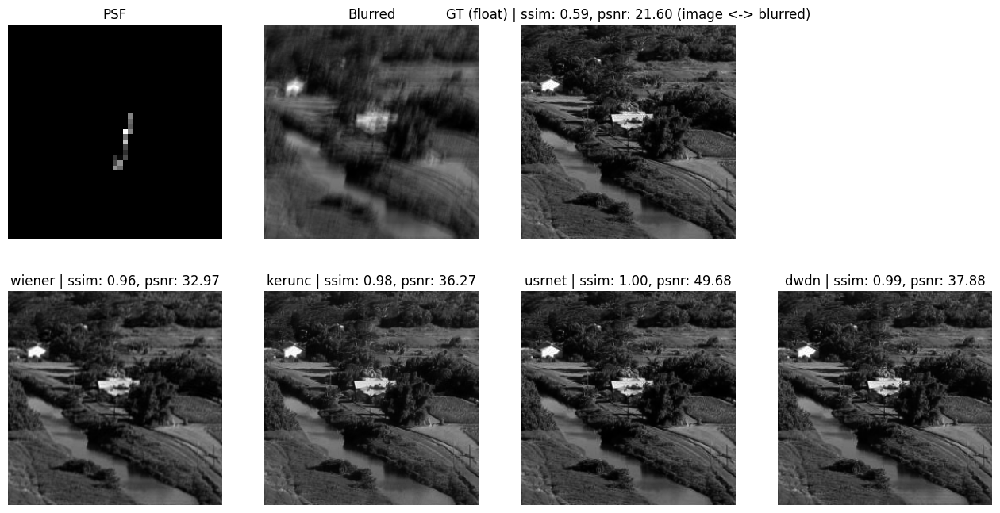

In [9]:
IS_NOISED = False

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_67.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-12.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='linrgb_float')

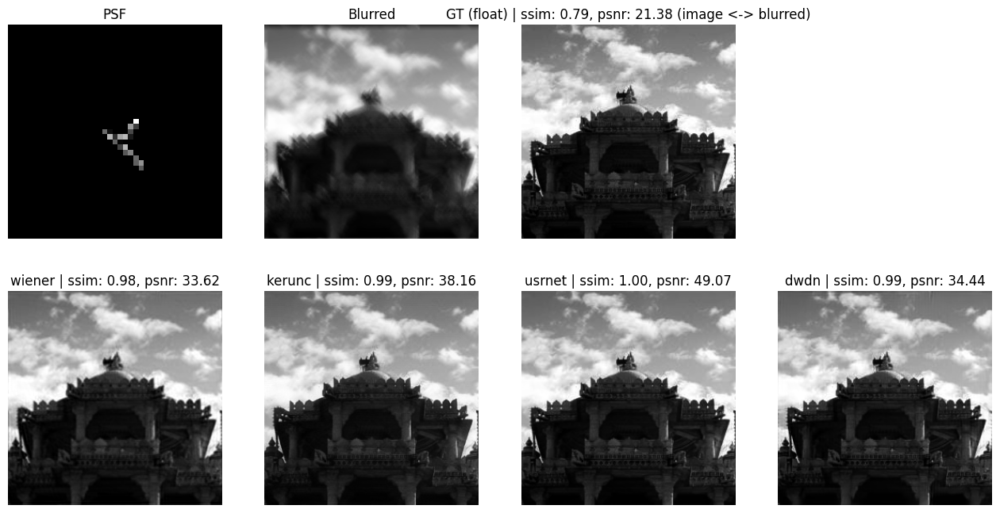

In [10]:
IS_NOISED = False

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_64.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-29.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='linrgb_float')

Визуально восстановленные разными моделями изображения не различимы.

### 2. Реалистичные условия (шум, другие типы дискретизации)

#### Метрики

1. Float с шумом

In [35]:
%%sql sqlite://

SELECT model, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_30_03 
WHERE discretization == 'linrgb_float' AND noised == True AND blur_type == 'motion_blur'
GROUP BY model;

Done.


model,AVG(psnr),AVG(ssim)
dwdn,31.58,0.97
kerunc,29.49,0.95
usrnet,36.09,0.98
wiener_blind_noise,25.04,0.78
wiener_nonblind_noise,24.51,0.85


2. linRGB 16bit

In [36]:
%%sql sqlite://

SELECT noised, model, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_30_03 
WHERE discretization == 'linrgb_16bit' AND blur_type == 'motion_blur'
GROUP BY noised, model;

Done.


noised,model,AVG(psnr),AVG(ssim)
0,dwdn,33.66,0.98
0,kerunc,32.11,0.97
0,usrnet,46.72,1.0
0,wiener_blind_noise,28.01,0.95
0,wiener_nonblind_noise,25.22,0.93
1,dwdn,31.58,0.97
1,kerunc,29.49,0.95
1,usrnet,36.09,0.98
1,wiener_blind_noise,25.04,0.78
1,wiener_nonblind_noise,24.51,0.85


3. sRGB 8bit

In [37]:
%%sql sqlite://

SELECT noised, model, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_30_03 
WHERE discretization == 'srgb_8bit' AND blur_type == 'motion_blur'
GROUP BY noised, model;

Done.


noised,model,AVG(psnr),AVG(ssim)
0,dwdn,25.45,0.92
0,kerunc,26.05,0.93
0,usrnet,22.95,0.78
0,wiener_blind_noise,22.7,0.82
0,wiener_nonblind_noise,22.34,0.83
1,dwdn,24.39,0.88
1,kerunc,23.43,0.84
1,usrnet,21.23,0.75
1,wiener_blind_noise,20.59,0.67
1,wiener_nonblind_noise,21.44,0.75


Нейросети по метрикам выигрывают у Винера в случае шума и/или смены типа дискретизации.

#### Иллюстрации

1. Float с шумом

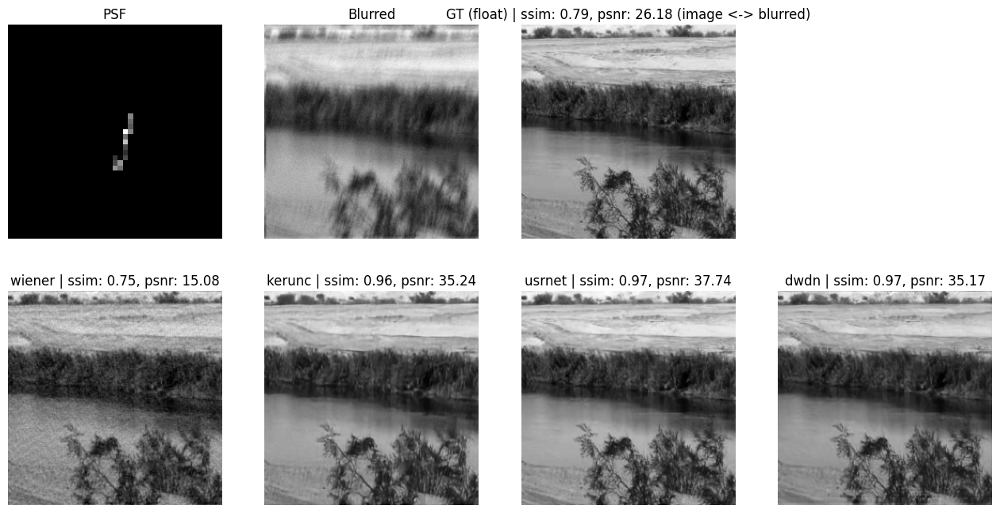

In [12]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_14.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-12.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='linrgb_float')

2. Noised linRGB 16bit

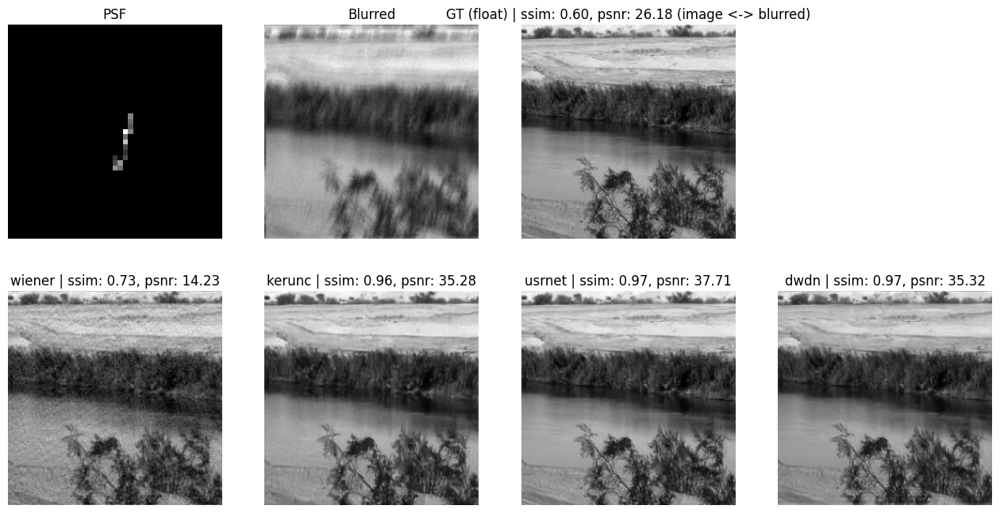

In [13]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_14.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-12.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_16bit',
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='linrgb_16bit')

3. Noised sRGB 8bit

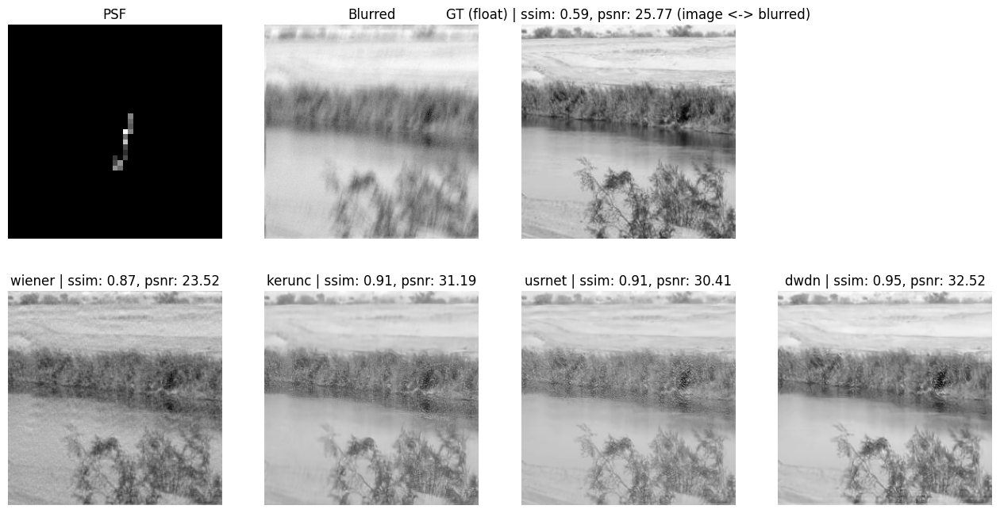

In [14]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_14.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-12.npy',
    is_noised=IS_NOISED,
    discretization='srgb_8bit',
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='srgb_8bit')

У Винера есть видимые артефакты, которых нет у нейросетей (восстановленные изображения более сглаженые и натуральные). Кроме того, нейросети лучше справляются и с linRGB пространством, которое скорее всего не видели во время обучения (обычно учат на float / 8bit sRGB)

## №2 Нейросети значительно хуже работают на тех видах размытиях, на которых не были обучены

- **DWDN**, **KerUnc**: обучены на motion blur <-> незнакомые виды размытия: gauss blur, eye blur

- **USRNet**: обучена на motion blur, gauss blur <-> незнакомый вид размытия: eye blur

**Вывод**: в процесс обучения нейросетевые модели приобретают обобщающую способность по отношению к незнакомым ядрам в пределах одного типа размытия, но настраиваются под конкретный тип размытия.

#### Метрики

- Упрощенный запрос: смотрим только float дискретизацию без шума (как наиболее простой случай)


In [39]:
%%sql sqlite://

SELECT model, blur_type, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_30_03 
WHERE model IN ('dwdn', 'kerunc', 'usrnet') AND blur_type IN ('eye_blur', 'gauss_blur') AND discretization == 'linrgb_float' AND noised == False
GROUP BY model, blur_type;

Done.


model,blur_type,AVG(psnr),AVG(ssim)
dwdn,eye_blur,18.32,0.68
dwdn,gauss_blur,22.46,0.81
kerunc,eye_blur,20.21,0.69
kerunc,gauss_blur,23.39,0.82
usrnet,eye_blur,30.98,0.94
usrnet,gauss_blur,28.24,0.92


USRNet справилась с eye_blur даже лучше, чем с gauss_blur

- Детализированный запрос по видам дискретизации и шуму

In [40]:
%%sql sqlite://

SELECT model, blur_type, discretization, noised, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_30_03 
WHERE model IN ('dwdn', 'kerunc', 'usrnet') AND blur_type IN ('eye_blur', 'gauss_blur') 
GROUP BY model, blur_type, discretization, noised;


Done.


model,blur_type,discretization,noised,AVG(psnr),AVG(ssim)
dwdn,eye_blur,linrgb_16bit,0,18.32,0.68
dwdn,eye_blur,linrgb_16bit,1,18.13,0.66
dwdn,eye_blur,linrgb_8bit,0,18.26,0.67
dwdn,eye_blur,linrgb_8bit,1,18.13,0.66
dwdn,eye_blur,linrgb_float,0,18.32,0.68
dwdn,eye_blur,linrgb_float,1,18.13,0.66
dwdn,eye_blur,srgb_8bit,0,17.67,0.67
dwdn,eye_blur,srgb_8bit,1,17.39,0.65
dwdn,gauss_blur,linrgb_16bit,0,22.46,0.81
dwdn,gauss_blur,linrgb_16bit,1,22.33,0.81


#### Иллюстрации

Eye blur: big without noise

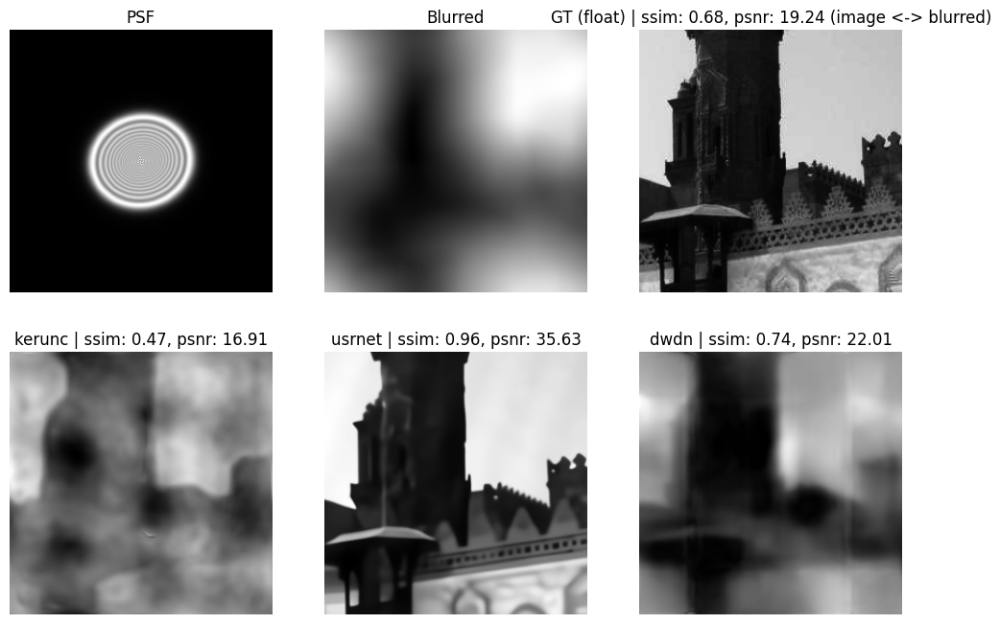

In [15]:
IS_NOISED = False

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/big-psf-0.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

viz(image, psf, blurred, blurred_3d, nn_models, is_noised=IS_NOISED, discretization='linrgb_float')

Eye blur: small without noise

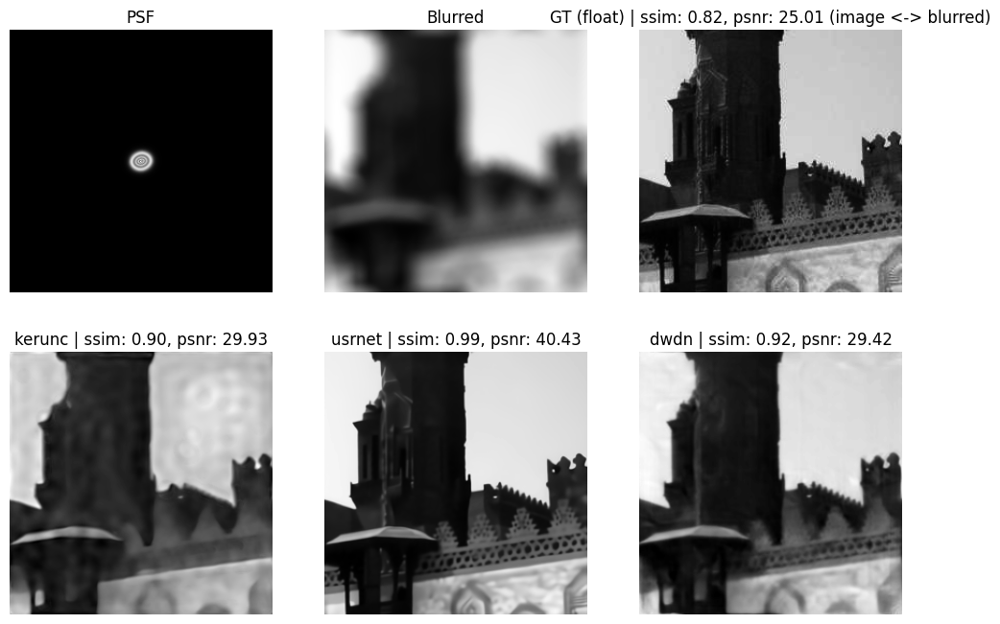

In [16]:
IS_NOISED = False

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/small-psf-0.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

viz(image, psf, blurred, blurred_3d, nn_models, is_noised=IS_NOISED, discretization='linrgb_float')

With noise:

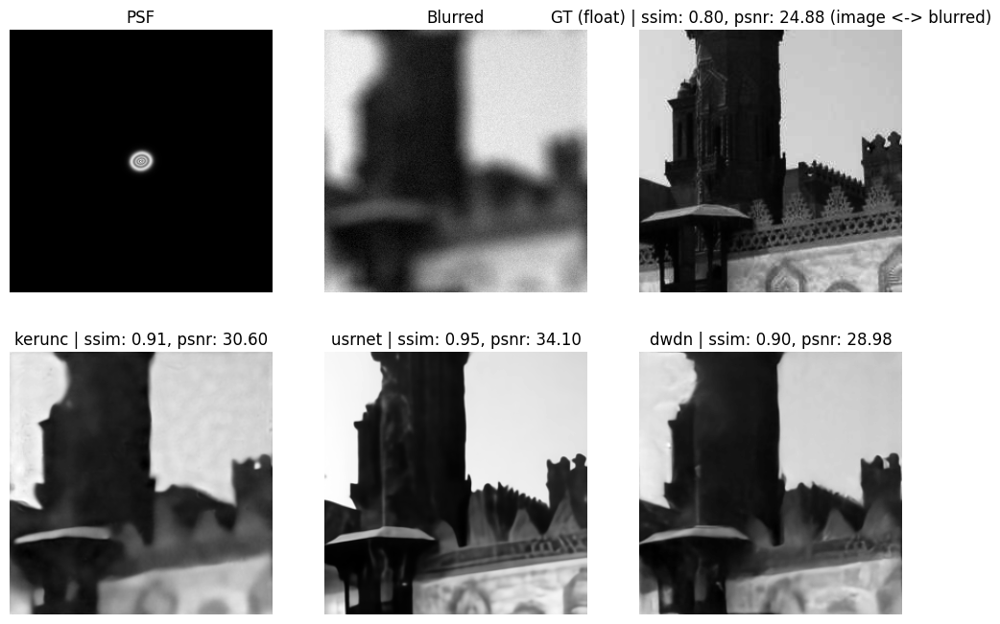

In [17]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/small-psf-0.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

viz(image, psf, blurred, blurred_3d, nn_models, is_noised=IS_NOISED, discretization='linrgb_float')

Gauss blur: no noise

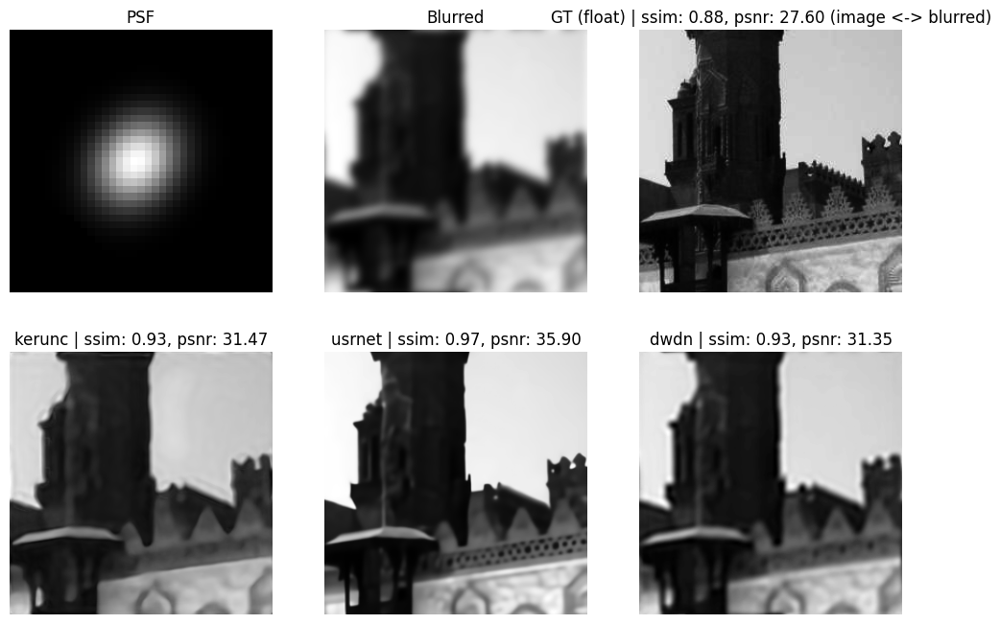

In [18]:
IS_NOISED = False

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-0.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

viz(image, psf, blurred, blurred_3d, nn_models, is_noised=IS_NOISED, discretization='linrgb_float')

По USRNet наглядный пример, как достаточно высокие метрики не гарантируют визуального хорошего качества

Gauss blur: with noise

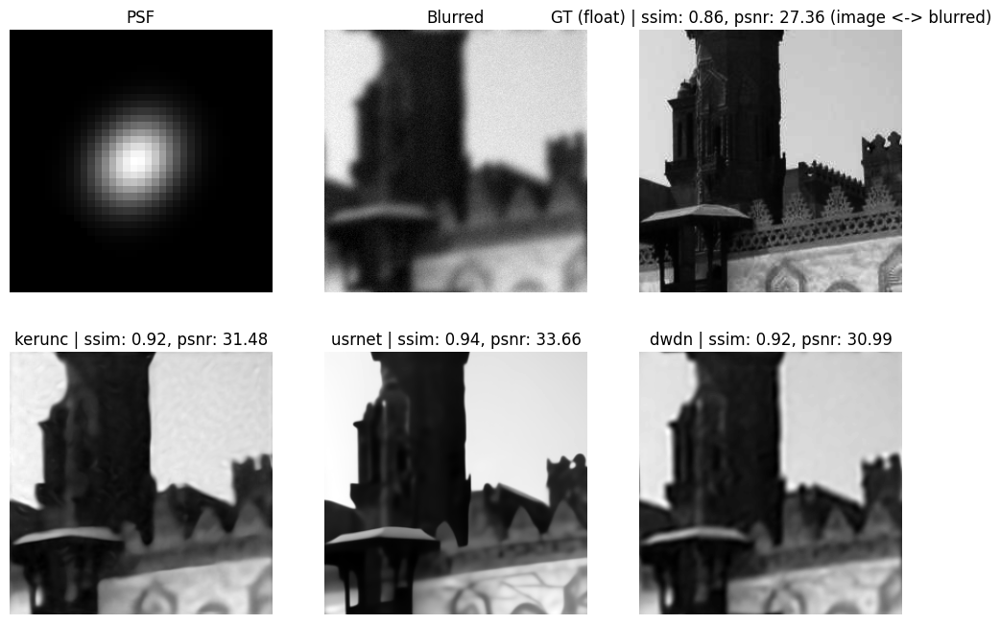

In [19]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-0.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

viz(image, psf, blurred, blurred_3d, nn_models, is_noised=IS_NOISED, discretization='linrgb_float')

## №3 Виды размытия имеют разную "сложность" - ?

Проверка проводилась на Винере с linrgb float изображениями без шума (чтобы исключить влияние дискретности и шума)

Однако результаты эксперимента (замер метрик между gt и размытым изображением без восстановления) и метрики на валидации между собой не согласуются.

Результаты эксперимента: **gauss blur `<` motion blur `<` eye blur**, где `<` означает проще
:


- For **gauss_blur**: mean PSNR: 20.299, mean SSIM: 0.735

- For **motion_blur**: mean PSNR: 19.283, mean SSIM: 0.690

- For **small_eye_blur**: mean PSNR: 18.916, mean SSIM: 0.690

- For **medium_eye_blur**: mean PSNR: 16.098, mean SSIM: 0.609

- For **big_eye_blur**: mean PSNR: 15.082, mean SSIM: 0.596

#### Метрики

- без шума: **motion blur `<` eye blur `<` gauss blur**

In [41]:
%%sql sqlite://

SELECT blur_type, model, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_30_03 
WHERE model IN ('wiener_nonblind_noise') AND discretization == 'linrgb_float' AND noised == False
GROUP BY blur_type, model
ORDER BY ROUND(AVG(psnr), 2);

Done.


blur_type,model,AVG(psnr),AVG(ssim)
gauss_blur,wiener_nonblind_noise,25.3,0.9
eye_blur,wiener_nonblind_noise,34.71,0.97
motion_blur,wiener_nonblind_noise,62.76,0.99


- с шумом: **motion blur `<` gauss blur `<` eye blur**

In [42]:
%%sql sqlite://

SELECT blur_type, model, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_30_03 
WHERE model IN ('wiener_nonblind_noise') AND discretization == 'linrgb_float' AND noised == True
GROUP BY blur_type, model;

Done.


blur_type,model,AVG(psnr),AVG(ssim)
eye_blur,wiener_nonblind_noise,18.82,0.61
gauss_blur,wiener_nonblind_noise,20.69,0.75
motion_blur,wiener_nonblind_noise,24.51,0.85


#### Визуализация

На float изображениях с шумом и без.

In [20]:
wu_models = {key: value for key, value in models.items() if key in ['wiener', 'usrnet']}

1) Motion blur

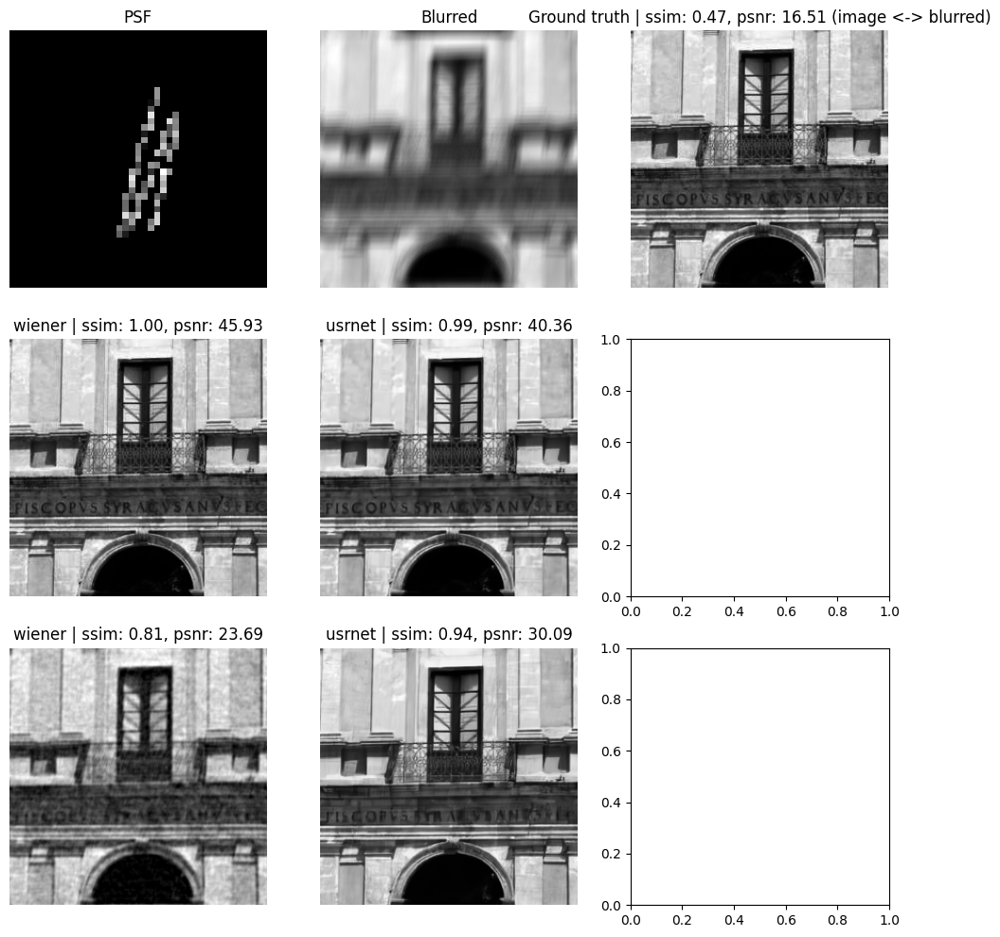

In [22]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-15.npy',
    is_noised=False,
    discretization='linrgb_float',
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-15.npy',
    is_noised=True,
    discretization='linrgb_float',
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, wu_models, discretization='linrgb_float')

2. Gauss blur

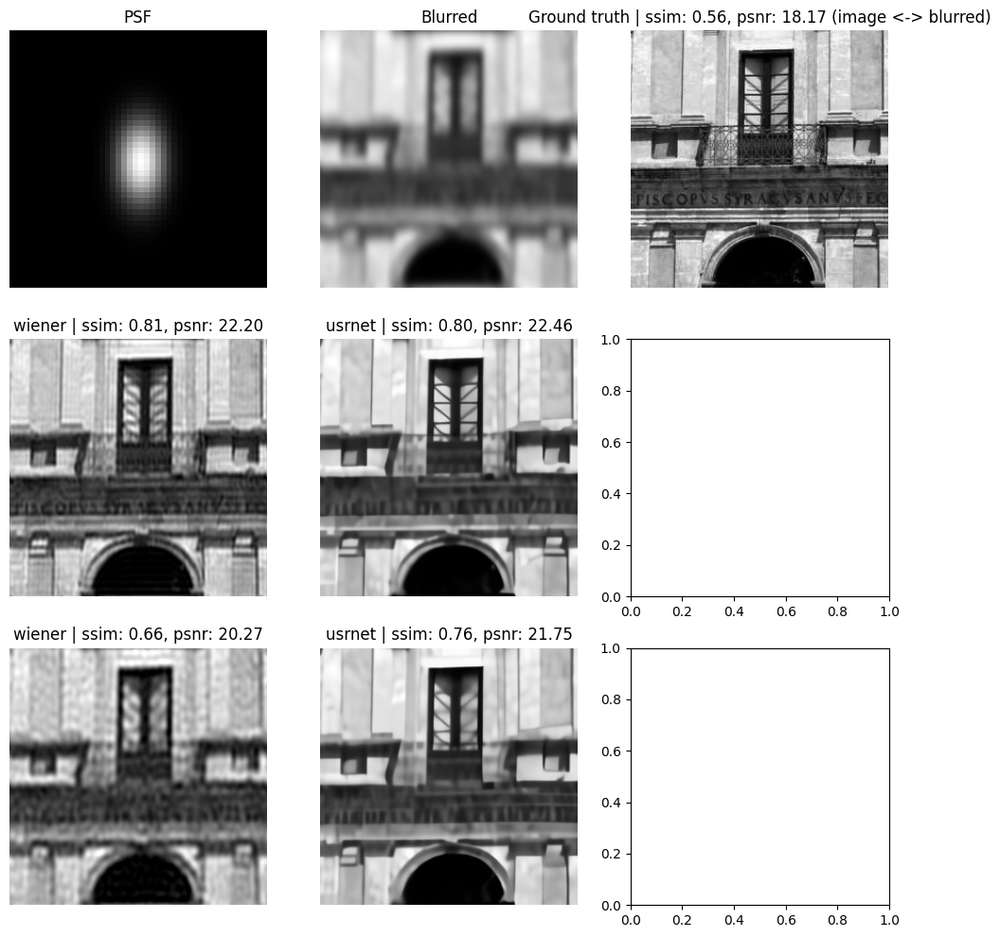

In [25]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-4.npy',
    is_noised=False,
    discretization='linrgb_float',
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-4.npy',
    is_noised=True,
    discretization='linrgb_float',
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, wu_models, discretization='linrgb_float')

3. Eye blur: medium

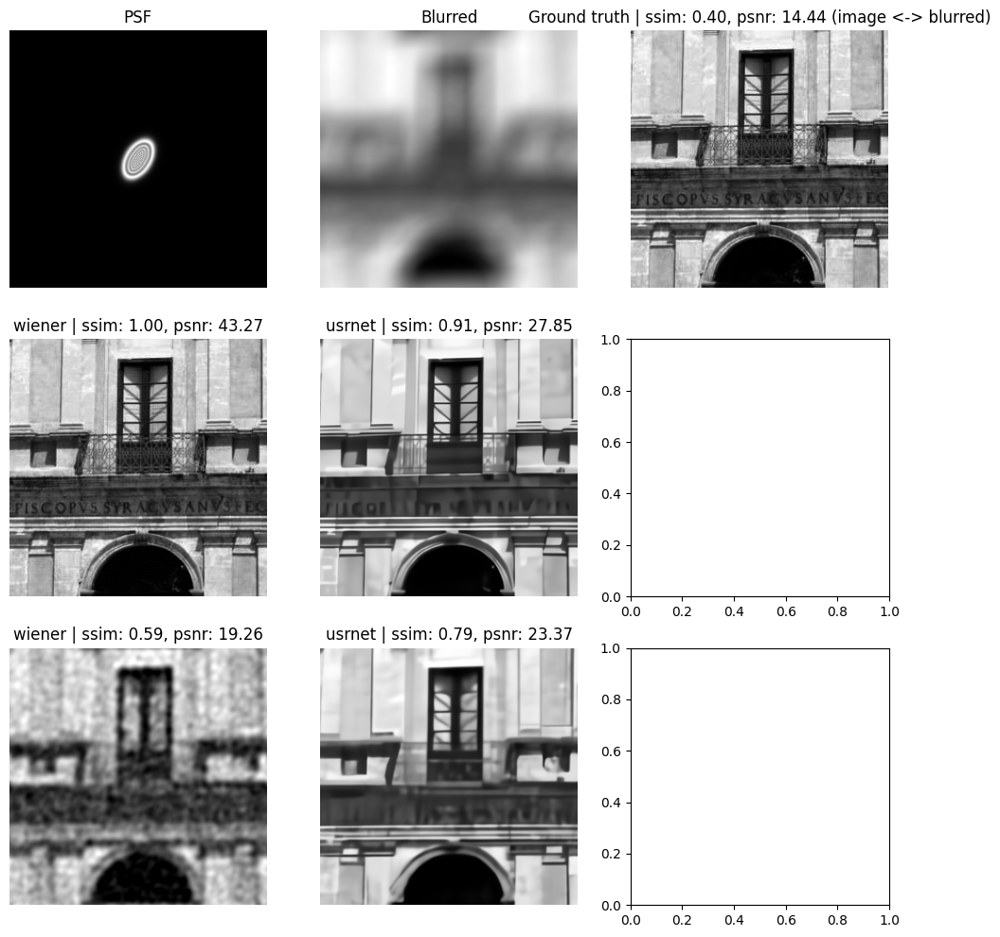

In [26]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/medium-psf-1.npy',
    is_noised=False,
    discretization='linrgb_float',
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/medium-psf-1.npy',
    is_noised=True,
    discretization='linrgb_float',
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, wu_models, discretization='linrgb_float',)

Eye blur: big

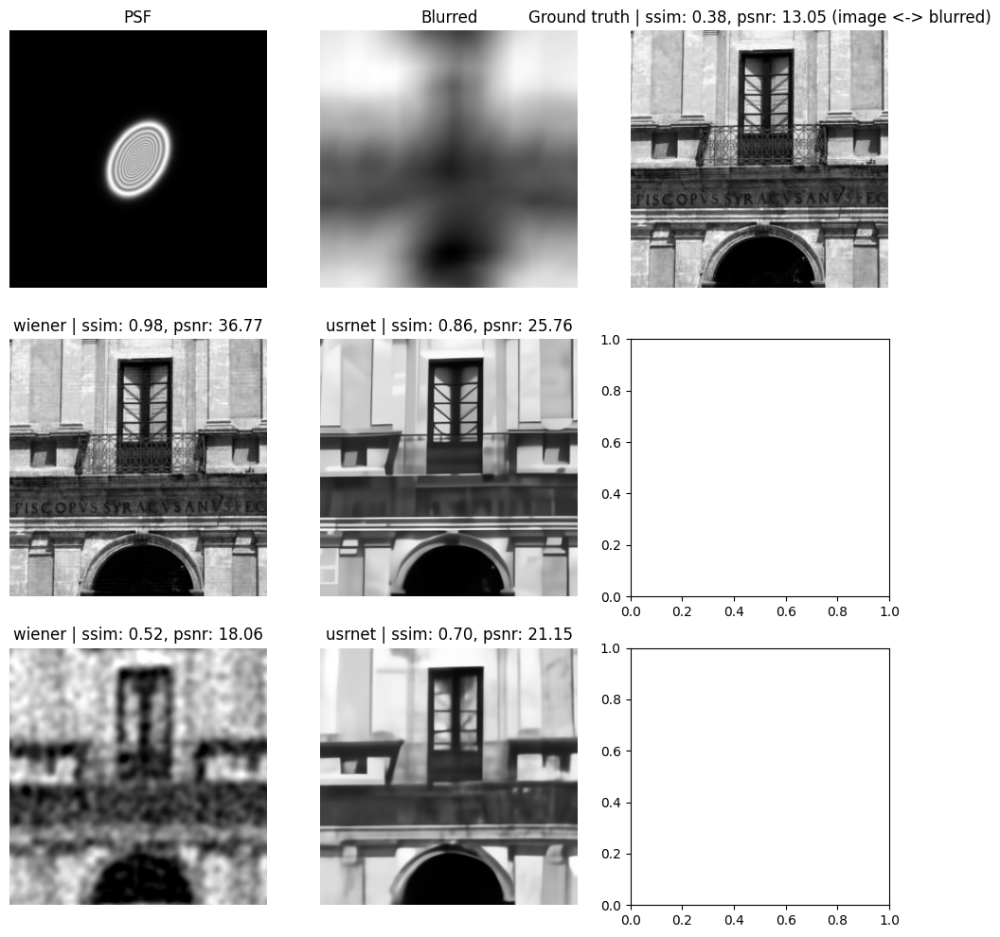

In [27]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/big-psf-1.npy',
    is_noised=False,
    discretization='linrgb_float',
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/big-psf-1.npy',
    is_noised=True,
    discretization='linrgb_float',
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, wu_models, discretization='linrgb_float')

## [x - тест был только на png (icons & sun)] №4 На качество восстановления влияет только тип размытия, но не тип GT изображения

Смотрим только по motion blur, как общему для всех домену

#### Метрики

In [ ]:
%%sql sqlite://

SELECT discretization, image_dataset, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_30_03 
WHERE discretization in ('float', 'srgb_8bit') AND noised == False AND blur_type == 'motion_blur'
GROUP BY discretization, image_dataset;

SSIM примерно на одном уровне (0.95 - 0.99), PSNR в рамках одного типа дискретизации -- тоже (31 - 33.4 для srgb, 38.6-43.62 для float)

In [ ]:
%%sql sqlite://

SELECT model, image_dataset, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_30_03 
WHERE discretization in ('float', 'srgb_8bit') AND noised == False AND blur_type == 'motion_blur'
GROUP BY model, image_dataset;

#### Визуально

1) Sun (real-life, пейзажи)

In [ ]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_67.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_67.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, models, discretization='float', image_ext='png')

2) BSDS300 (real-life, пейзажи, люди)

In [ ]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/BSDS300/19021.jpg',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/BSDS300/19021.jpg',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, models, discretization='srgb_8bit', image_ext='jpg')

3) Animals

In [ ]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/animals/1 (11).jpg',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/animals/1 (11).jpg',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, models, discretization='srgb_8bit', image_ext='jpg')

4) City

In [ ]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/city/01 (4).jpg',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/city/01 (4).jpg',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, models, discretization='srgb_8bit', image_ext='jpg')

5. Faces

In [ ]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/faces/avatar-2ce9d6778da089be2619b180c851421b.jpg',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/faces/avatar-2ce9d6778da089be2619b180c851421b.jpg',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, models, discretization='srgb_8bit', image_ext='jpg')

6. Icons

In [ ]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/icons_jpg/1/cat-animal.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/icons_jpg/1/cat-animal.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, models, discretization='float', image_ext='png')

7. Nature

In [ ]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/nature/1 (2).jpg',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/nature/1 (2).jpg',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, models, discretization='srgb_8bit', image_ext='jpg')

8. Texts

In [ ]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/texts/_1_3.jpg',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=False,
)

_, _, noised_blurred, noised_blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/texts/_1_3.jpg',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-13.npy',
    is_noised=True,
)

viz_split_noise(image, psf, blurred, noised_blurred, blurred_3d, noised_blurred_3d, models, discretization='srgb_8bit', image_ext='jpg')

## №5 Дискретизация имеет разную сложность

Деградация качества: **linrgb float -> linRGB 16 bit -> linRGB 8 bit -> sRGB 8 bit**

#### Метрики

In [43]:
%%sql sqlite://
SELECT noised, discretization, ROUND(AVG(psnr), 2) AS 'AVG(psnr)', ROUND(AVG(ssim), 2) as 'AVG(ssim)'
FROM full_test_30_03 
-- WHERE blur_type == 'motion_blur'
GROUP BY noised, discretization
ORDER BY noised, ROUND(AVG(psnr), 2), ROUND(AVG(ssim), 2);

Done.


noised,discretization,AVG(psnr),AVG(ssim)
0,srgb_8bit,19.36,0.71
0,linrgb_8bit,24.67,0.82
0,linrgb_16bit,25.22,0.83
0,linrgb_float,29.13,0.87
1,srgb_8bit,18.71,0.66
1,linrgb_8bit,23.09,0.75
1,linrgb_16bit,23.12,0.75
1,linrgb_float,23.12,0.75


#### Визуализация

##### 1) Без шума

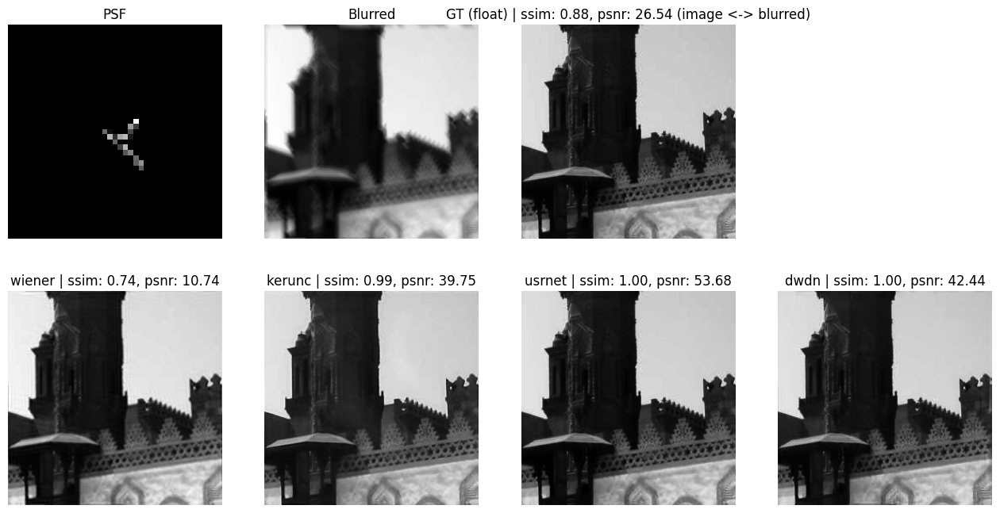

In [28]:
IS_NOISED = False
DISCRETIZATION = 'linrgb_float'

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-29.npy',
    is_noised=IS_NOISED,
    discretization=DISCRETIZATION,
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization=DISCRETIZATION)

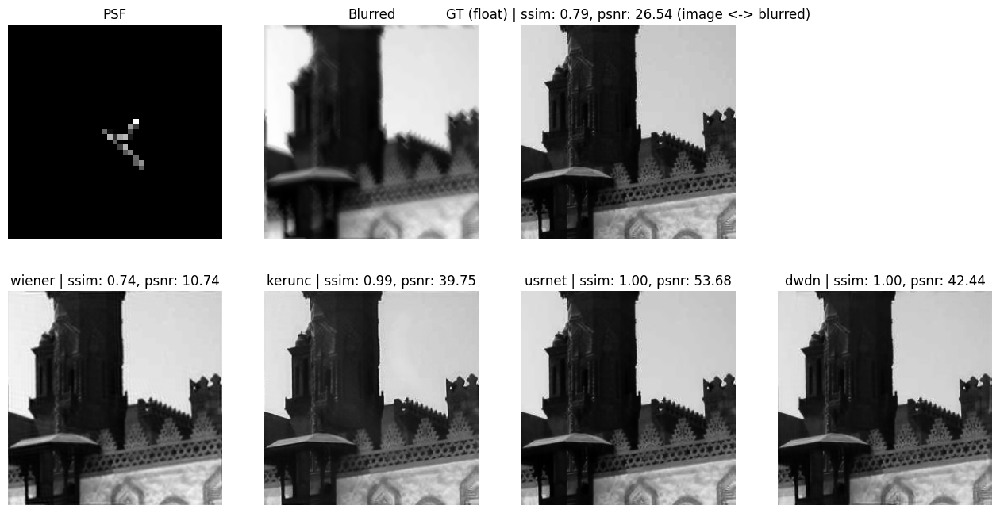

In [29]:
IS_NOISED = False
DISCRETIZATION = 'linrgb_16bit'

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-29.npy',
    is_noised=IS_NOISED,
    discretization=DISCRETIZATION,
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization=DISCRETIZATION)

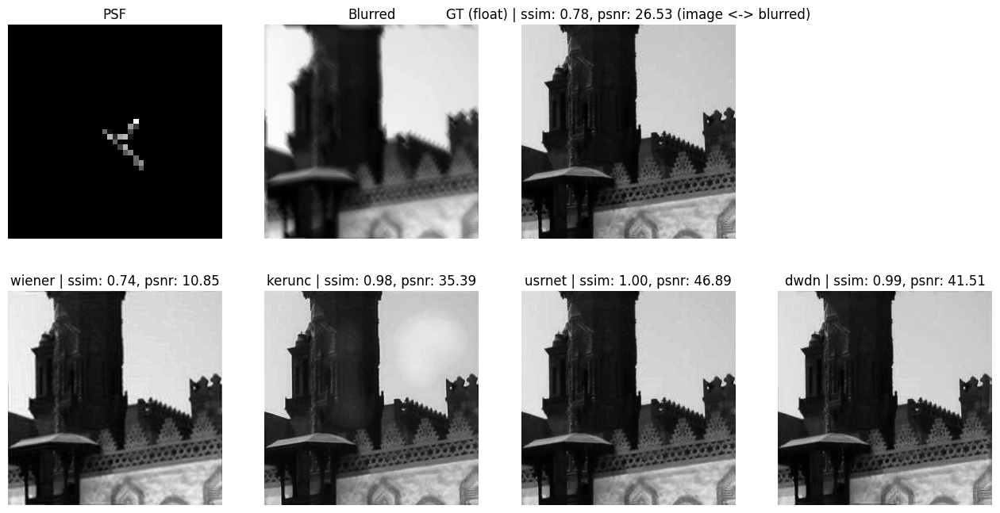

In [30]:
IS_NOISED = False
DISCRETIZATION = 'linrgb_8bit'

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-29.npy',
    is_noised=IS_NOISED,
    discretization=DISCRETIZATION,
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization=DISCRETIZATION)

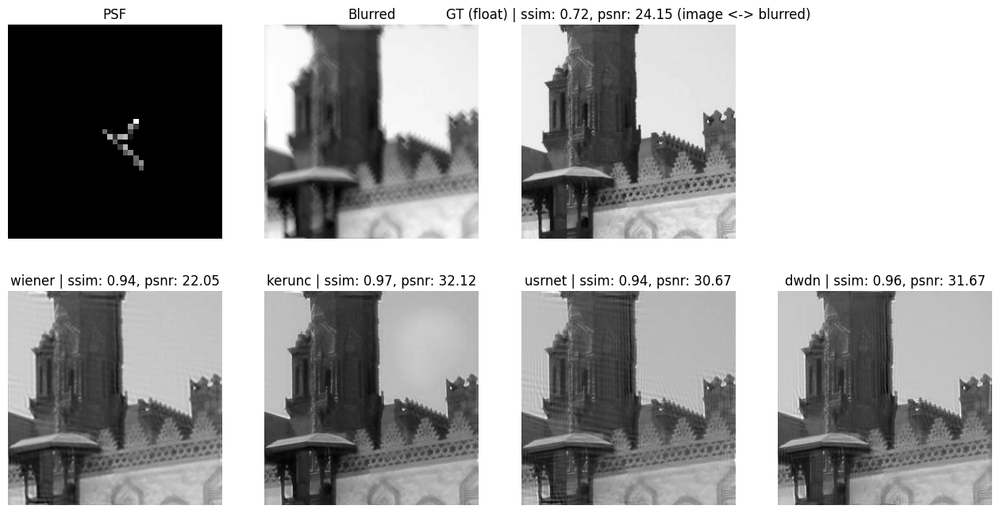

In [31]:
IS_NOISED = False
DISCRETIZATION = 'srgb_8bit'

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-29.npy',
    is_noised=IS_NOISED,
    discretization=DISCRETIZATION,
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization=DISCRETIZATION)

##### 2) С шумом

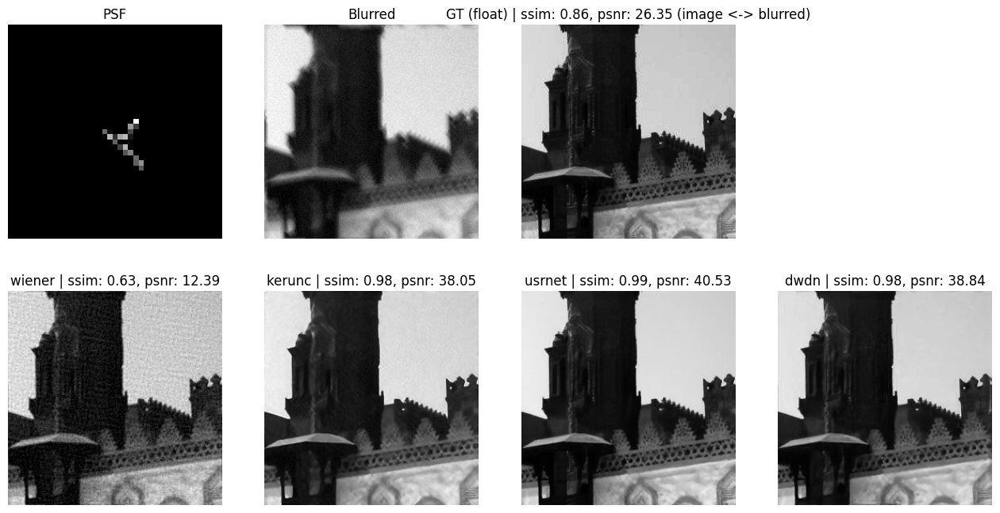

In [32]:
IS_NOISED = True
DISCRETIZATION = 'linrgb_float'

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-29.npy',
    is_noised=IS_NOISED,
    discretization=DISCRETIZATION,
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization=DISCRETIZATION)

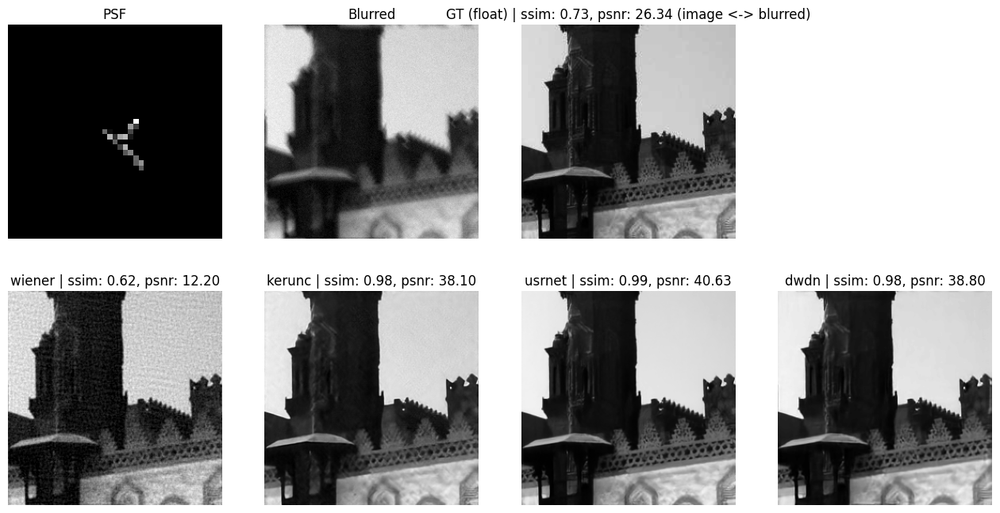

In [33]:
IS_NOISED = True
DISCRETIZATION = 'linrgb_16bit'

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-29.npy',
    is_noised=IS_NOISED,
    discretization=DISCRETIZATION,
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization=DISCRETIZATION)

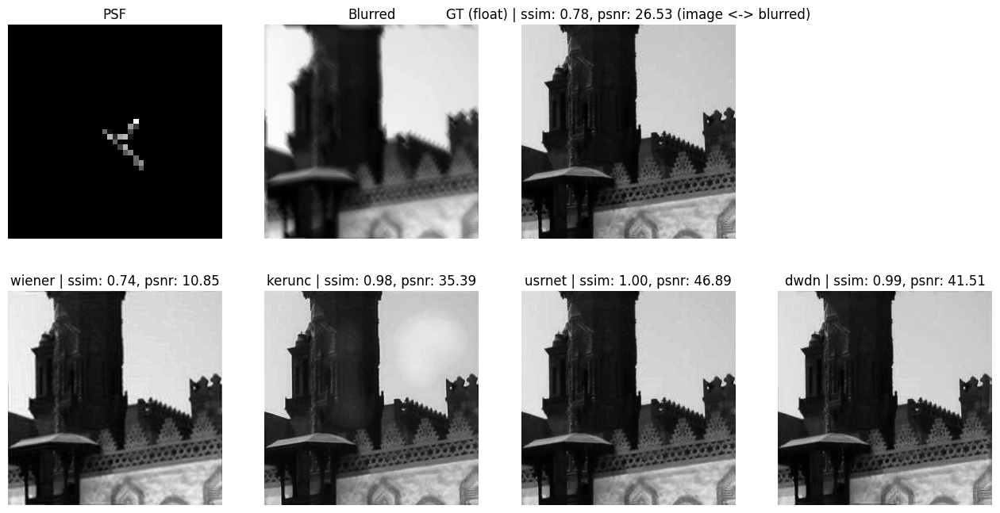

In [34]:
IS_NOISED = False
DISCRETIZATION = 'linrgb_8bit'

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-29.npy',
    is_noised=IS_NOISED,
    discretization=DISCRETIZATION,
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization=DISCRETIZATION)

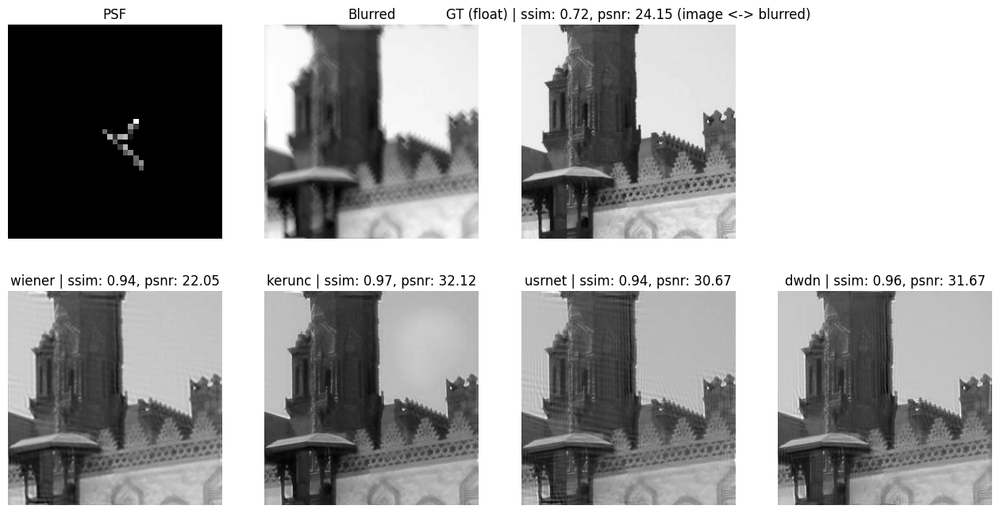

In [35]:
IS_NOISED = False
DISCRETIZATION = 'srgb_8bit'

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-29.npy',
    is_noised=IS_NOISED,
    discretization=DISCRETIZATION,
)

viz(image, psf, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization=DISCRETIZATION)

## №6 Робастность к ошибкам в ядре размытия

У всех моделей и алгоритмов с этим не очень хорошо. Чуть лучше работает KerUnc, но ее специально разрабатывали под возможность работы с неточными оценками PSF.

In [23]:
distorter = PSFDistorter()

### Motion Blur

1: без шума

In [24]:
IS_NOISED = False

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-29.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

psf_distorted = distorter(ker=psf, v_g=0.01, gaus_var=0.8)

Изображение было размыто с `psf`, на вход алгоритму подаем `psf_distorted`:

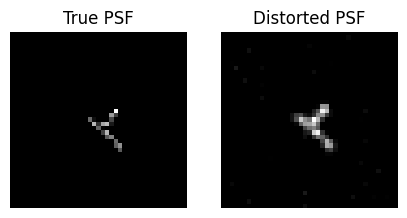

In [25]:
imsshow([psf, psf_distorted], titles=['True PSF', 'Distorted PSF'], figsize=(5, 3))

SSIM: 0.9920151682958603


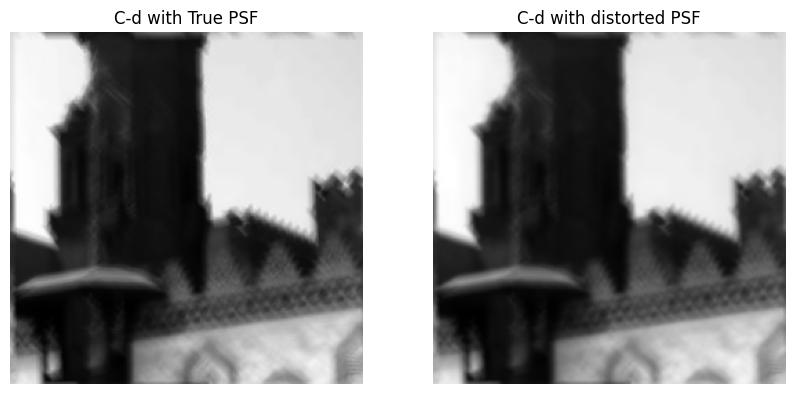

In [26]:
blurred_with_distorted_psf = convolve(image, psf_distorted)
imsshow([blurred, blurred_with_distorted_psf], titles=['C-d with True PSF', 'C-d with distorted PSF'], figsize=(10, 5))

print(f'SSIM: {ssim(blurred, blurred_with_distorted_psf)}')

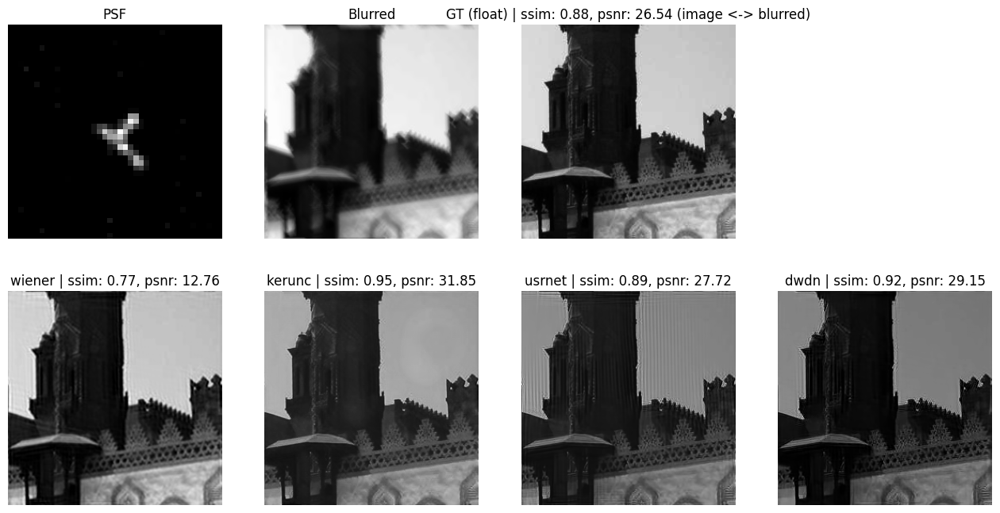

In [30]:
viz(image, psf_distorted, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='linrgb_float')

2. С шумом:

In [32]:
IS_NOISED = False

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_11.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-10.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

psf_distorted = distorter(ker=psf, v_g=0.01, gaus_var=0.8)

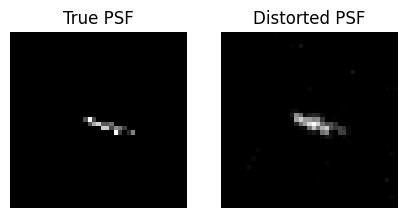

In [33]:
imsshow([psf, psf_distorted], titles=['True PSF', 'Distorted PSF'], figsize=(5, 3))

SSIM: 0.9716507736854553


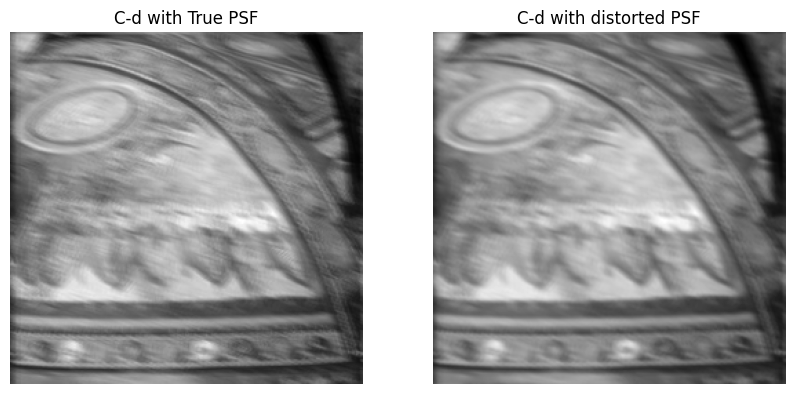

In [34]:
blurred_with_distorted_psf = convolve(image, psf_distorted)
imsshow([blurred, blurred_with_distorted_psf], titles=['C-d with True PSF', 'C-d with distorted PSF'], figsize=(10, 5))

print(f'SSIM: {ssim(blurred, blurred_with_distorted_psf)}')

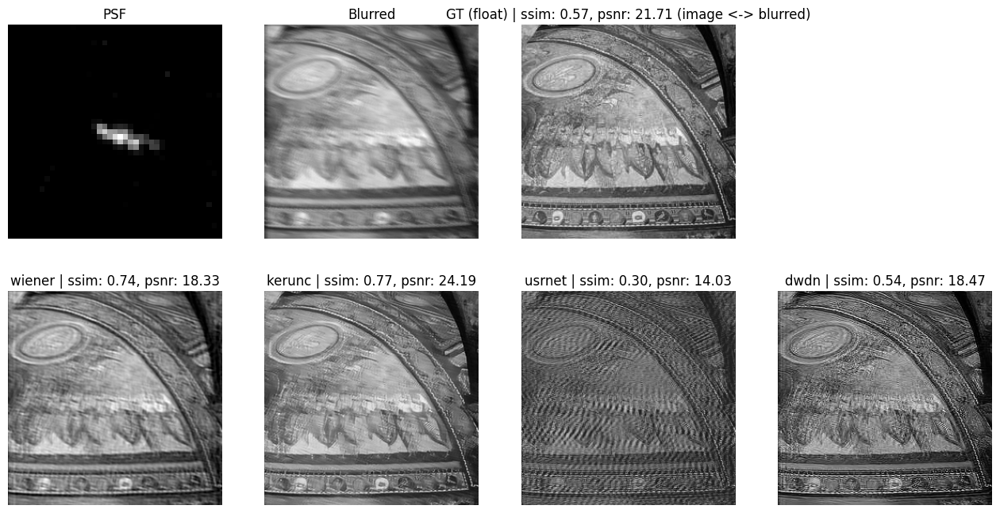

In [35]:
viz(image, psf_distorted, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='linrgb_float')

3: с шумом

In [36]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_25.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-15.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float'
)

psf_distorted = distorter(ker=psf, v_g=0.01, gaus_var=0.8)

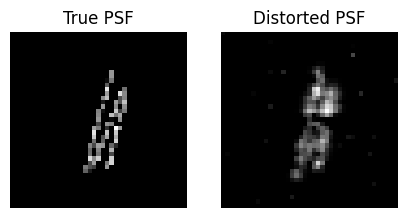

In [37]:
imsshow([psf, psf_distorted], titles=['True PSF', 'Distorted PSF'], figsize=(5, 3))

SSIM: 0.9525318981060982


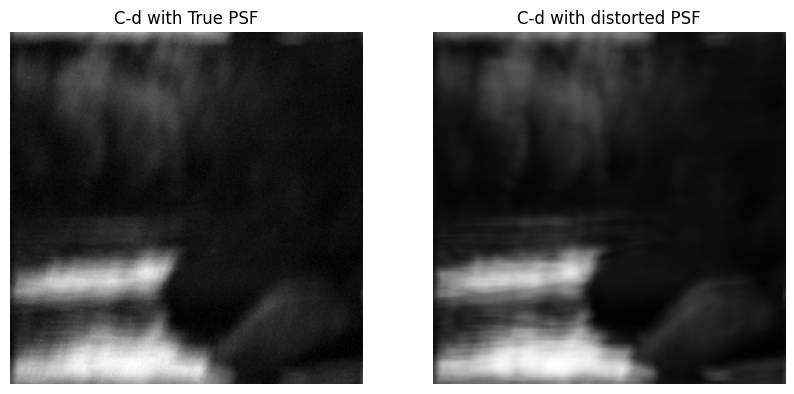

In [38]:
blurred_with_distorted_psf = convolve(image, psf_distorted)
imsshow([blurred, blurred_with_distorted_psf], titles=['C-d with True PSF', 'C-d with distorted PSF'], figsize=(10, 5))

print(f'SSIM: {ssim(blurred, blurred_with_distorted_psf)}')

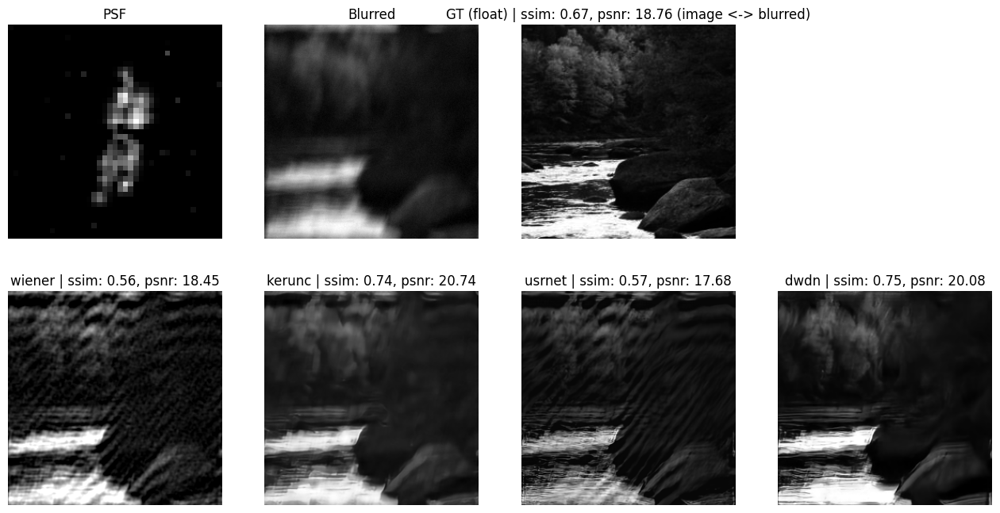

In [39]:
viz(image, psf_distorted, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='linrgb_float')

4: с шумом

In [40]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_67.png',
    psf_path='../datasets/kernels/motion-blur/processed/synthetic/synthetic-26.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

psf_distorted = distorter(ker=psf, v_g=0.01, gaus_var=0.8)

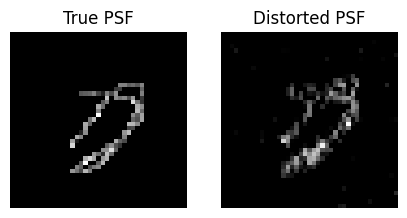

In [41]:
imsshow([psf, psf_distorted], titles=['True PSF', 'Distorted PSF'], figsize=(5, 3))

SSIM: 0.9662425944242478


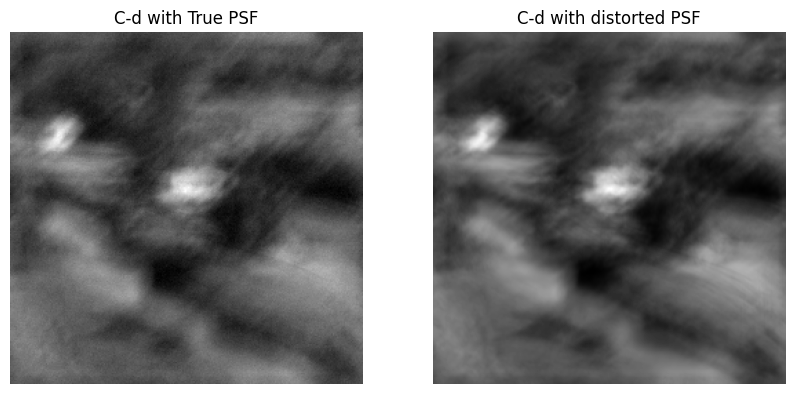

In [42]:
blurred_with_distorted_psf = convolve(image, psf_distorted)
imsshow([blurred, blurred_with_distorted_psf], titles=['C-d with True PSF', 'C-d with distorted PSF'], figsize=(10, 5))

print(f'SSIM: {ssim(blurred, blurred_with_distorted_psf)}')

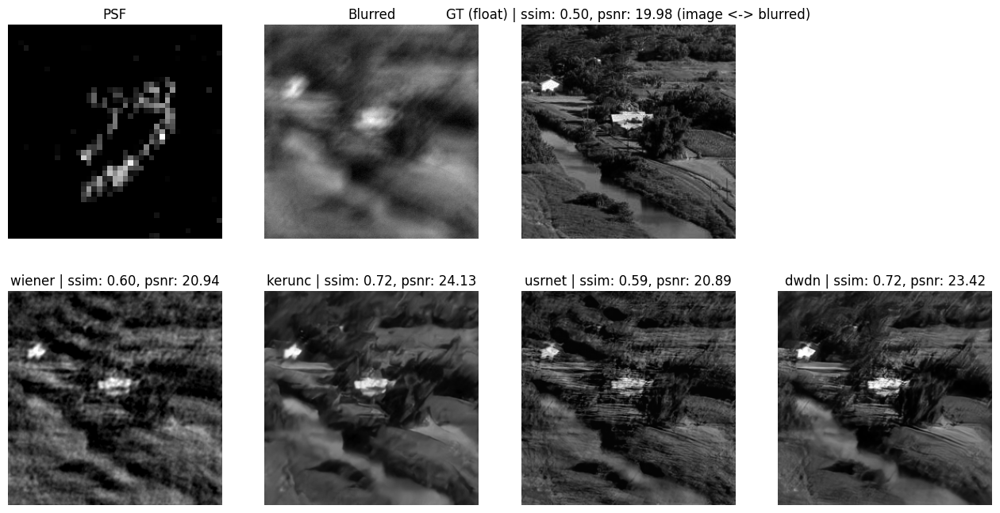

In [43]:
viz(image, psf_distorted, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='linrgb_float')

### Gauss blur

1.

In [65]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_67.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-0.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

psf_distorted = distorter(ker=psf, v_g=0, gaus_var=1e-1)

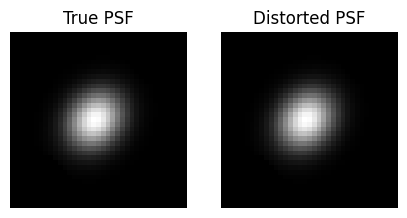

In [66]:
imsshow([psf, psf_distorted], titles=['True PSF', 'Distorted PSF'], figsize=(5, 3))

SSIM: 0.9780991669092178


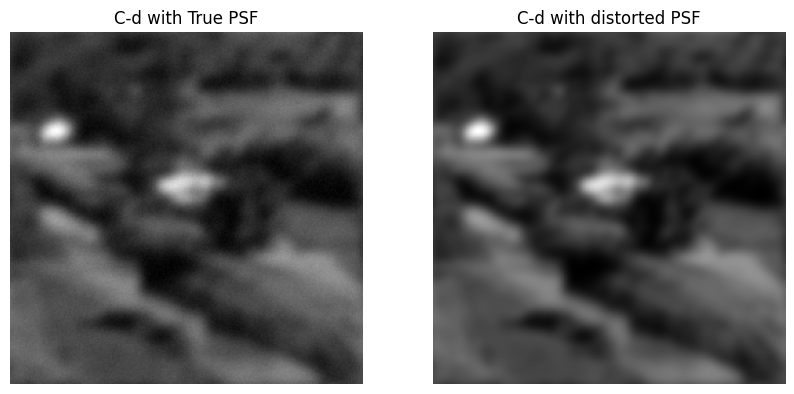

In [67]:
blurred_with_distorted_psf = convolve(image, psf_distorted)
imsshow([blurred, blurred_with_distorted_psf], titles=['C-d with True PSF', 'C-d with distorted PSF'], figsize=(10, 5))

print(f'SSIM: {ssim(blurred, blurred_with_distorted_psf)}')

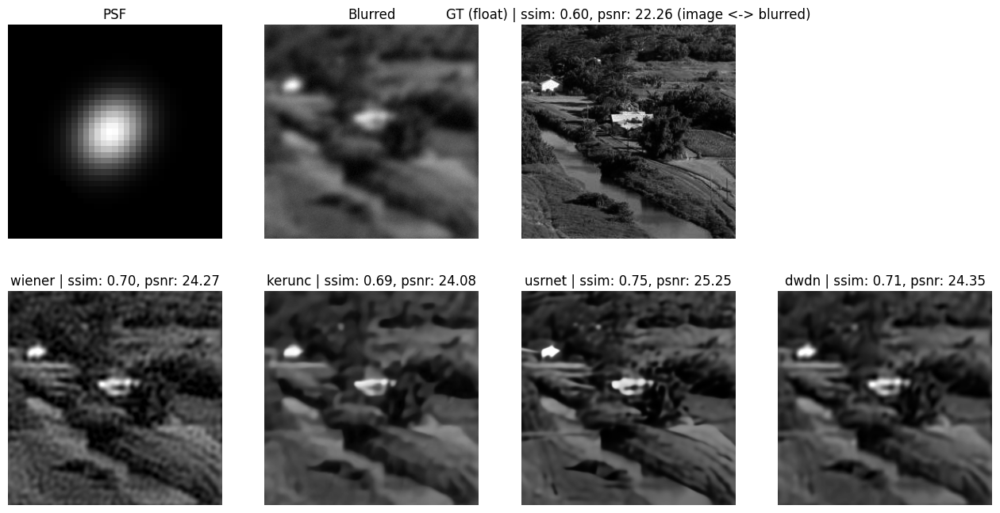

In [68]:
viz(image, psf_distorted, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='linrgb_float')

2.

In [69]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_68.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-10.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

psf_distorted = distorter(ker=psf, v_g=0, gaus_var=1e-1)

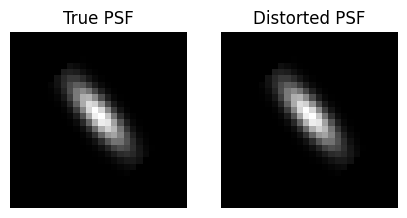

In [70]:
imsshow([psf, psf_distorted], titles=['True PSF', 'Distorted PSF'], figsize=(5, 3))

SSIM: 0.9773453400421143


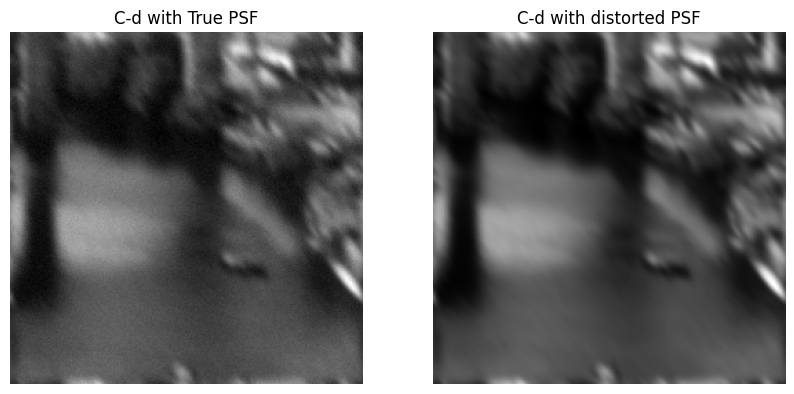

In [71]:
blurred_with_distorted_psf = convolve(image, psf_distorted)
imsshow([blurred, blurred_with_distorted_psf], titles=['C-d with True PSF', 'C-d with distorted PSF'], figsize=(10, 5))

print(f'SSIM: {ssim(blurred, blurred_with_distorted_psf)}')

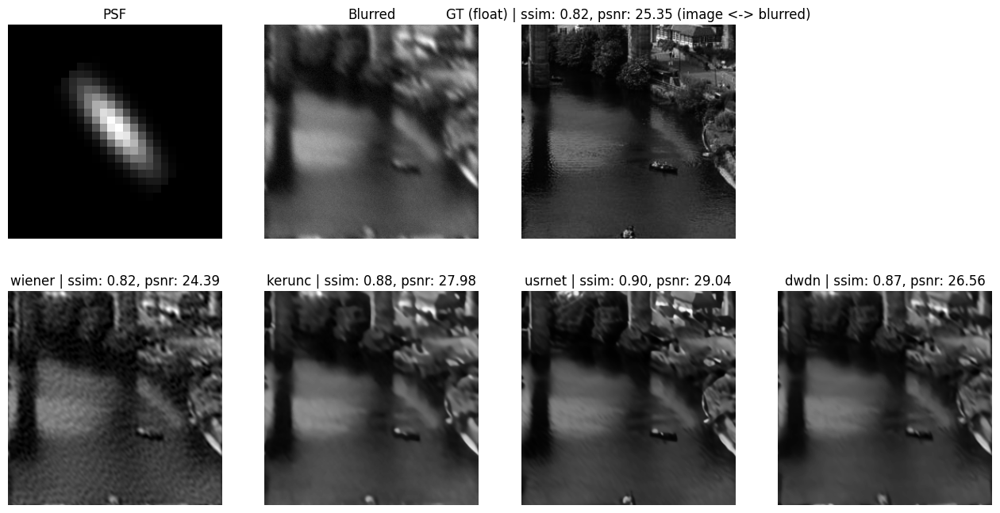

In [72]:
viz(image, psf_distorted, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='linrgb_float')

### 3 Eye blur

1.

In [73]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_34.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/small-psf-14.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

psf_distorted = distorter(ker=psf, v_g=0, gaus_var=1e-1)

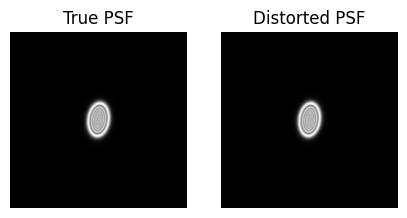

In [74]:
imsshow([psf, psf_distorted], titles=['True PSF', 'Distorted PSF'], figsize=(5, 3))

SSIM: 0.9746319931535721


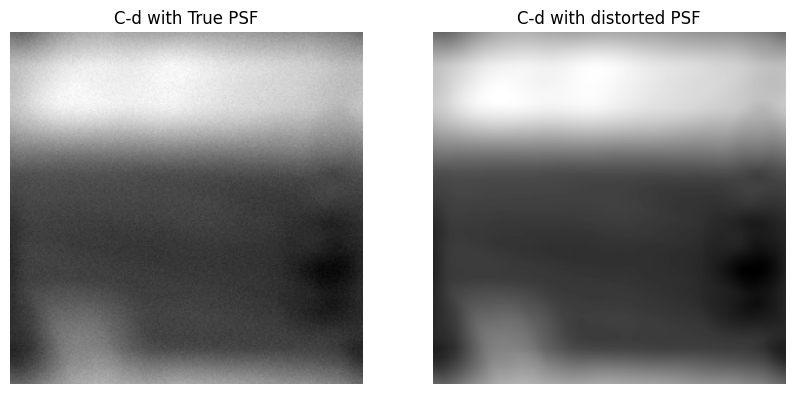

In [75]:
blurred_with_distorted_psf = convolve(image, psf_distorted)
imsshow([blurred, blurred_with_distorted_psf], titles=['C-d with True PSF', 'C-d with distorted PSF'], figsize=(10, 5))

print(f'SSIM: {ssim(blurred, blurred_with_distorted_psf)}')

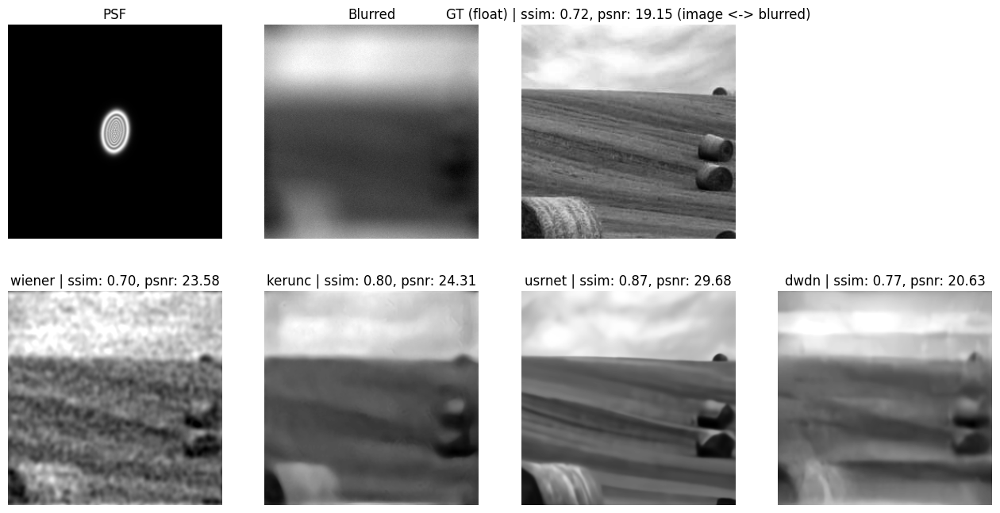

In [76]:
viz(image, psf_distorted, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='linrgb_float')

2.

In [77]:
IS_NOISED = True

image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_26.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/small-psf-29.npy',
    is_noised=IS_NOISED,
    discretization='linrgb_float',
)

psf_distorted = distorter(ker=psf, v_g=0, gaus_var=1e-1)

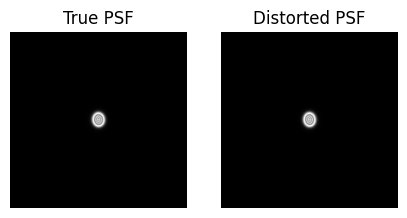

In [78]:
imsshow([psf, psf_distorted], titles=['True PSF', 'Distorted PSF'], figsize=(5, 3))

SSIM: 0.9739650033283234


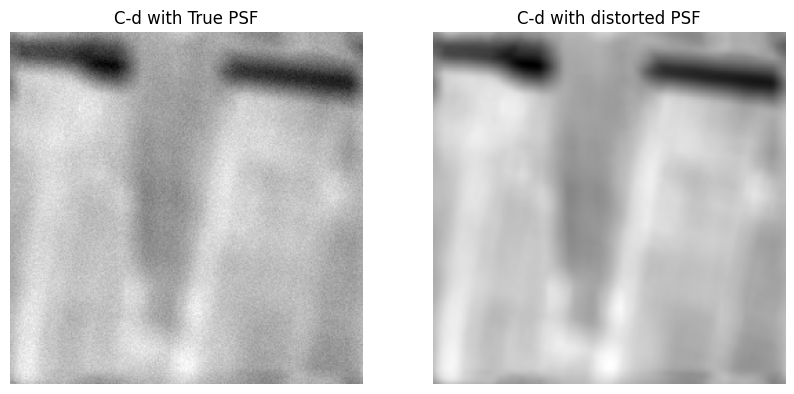

In [79]:
blurred_with_distorted_psf = convolve(image, psf_distorted)
imsshow([blurred, blurred_with_distorted_psf], titles=['C-d with True PSF', 'C-d with distorted PSF'], figsize=(10, 5))

print(f'SSIM: {ssim(blurred, blurred_with_distorted_psf)}')

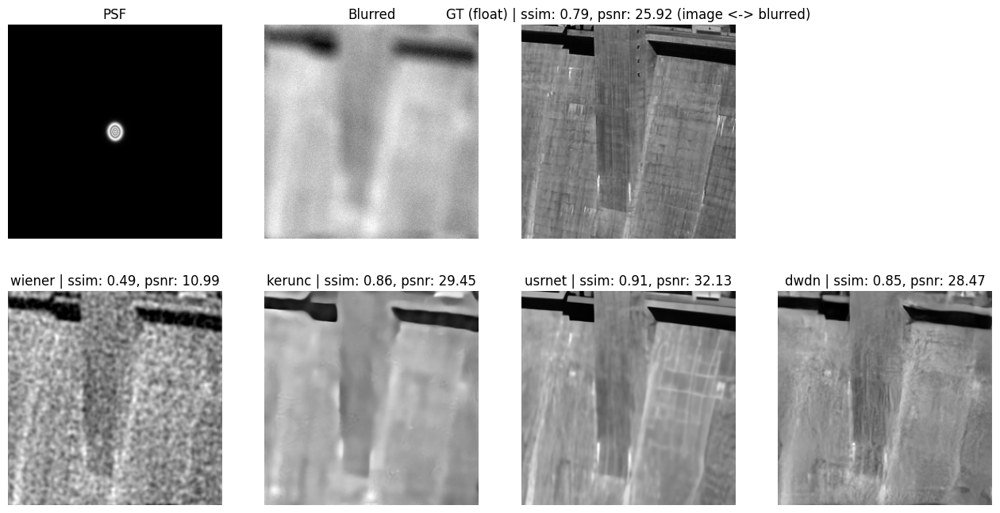

In [80]:
viz(image, psf_distorted, blurred, blurred_3d, models, is_noised=IS_NOISED, discretization='linrgb_float')

## №7 Проблемные примеры для Винера

Рассмотрен только самый простой случай (float без шума), т.к. другие сценарии были рассмотрены в №2.

#### Метрики

Основные трудности возникают с Гауссовским размытием:

In [44]:
%%sql sqlite://

SELECT blur_type, image, kernel, psnr, ssim
FROM full_test_30_03 
WHERE model == 'wiener_nonblind_noise' AND discretization == 'linrgb_float' AND noised == False AND ssim < 0.8
ORDER BY psnr, ssim
LIMIT 10;

Done.


blur_type,image,kernel,psnr,ssim
eye_blur,datasets/gt/Sun-gray/im_48.png,datasets/kernels/eye-psf/processed/synthetic/small-psf-23.npy,12.244544196315232,0.7939183159427643
motion_blur,datasets/gt/Sun-gray/im_48.png,datasets/kernels/motion-blur/processed/Sun/sun-0.npy,12.266480636337608,0.7945647550611497
gauss_blur,datasets/gt/Sun-gray/im_29.png,datasets/kernels/gauss-blur/processed/synthetic/synthetic-27.npy,12.993845852484442,0.7700162537083626
gauss_blur,datasets/gt/precomp/icons_jpg/3/ostrich.png,datasets/kernels/gauss-blur/processed/synthetic/synthetic-27.npy,18.935197887061655,0.7927352265313674
gauss_blur,datasets/gt/precomp/icons_jpg/1/cow.png,datasets/kernels/gauss-blur/processed/synthetic/synthetic-15.npy,19.778434595327393,0.7888621442912498
gauss_blur,datasets/gt/Sun-gray/im_31.png,datasets/kernels/gauss-blur/processed/synthetic/synthetic-2.npy,20.58942117610716,0.7638128830864429
gauss_blur,datasets/gt/Sun-gray/im_37.png,datasets/kernels/gauss-blur/processed/synthetic/synthetic-4.npy,22.802270518310603,0.7841638829390817
gauss_blur,datasets/gt/Sun-gray/im_24.png,datasets/kernels/gauss-blur/processed/synthetic/synthetic-13.npy,24.145382206574087,0.7945685086120367


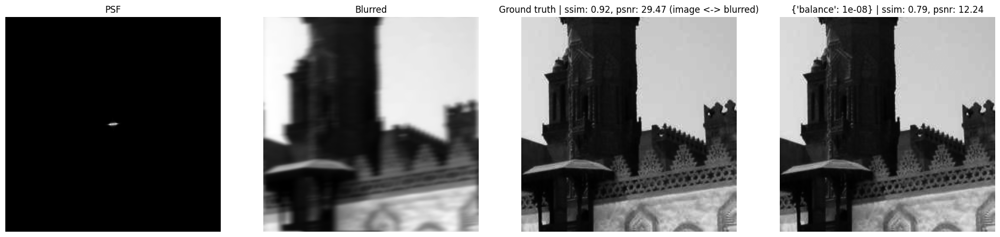

In [46]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/eye-psf/processed/synthetic/small-psf-23.npy',
    is_noised=False,
    discretization='linrgb_float',
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-8}])

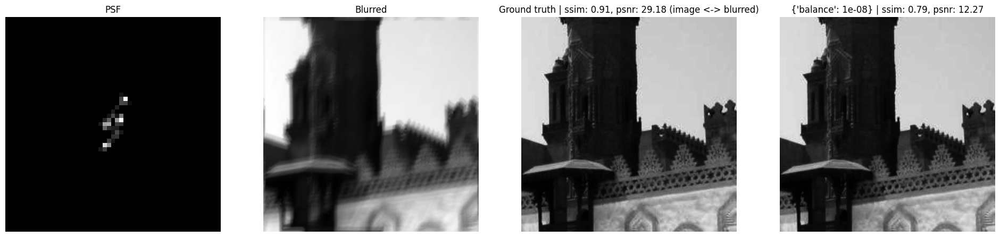

In [47]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_48.png',
    psf_path='../datasets/kernels/motion-blur/processed/Sun/sun-0.npy',
    is_noised=False,
    discretization='linrgb_float',
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-8}])

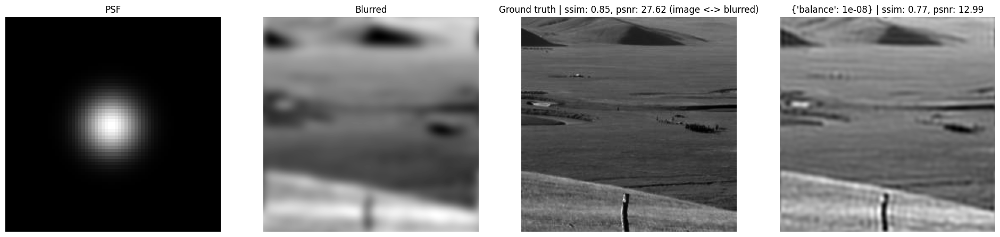

In [48]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_29.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-27.npy',
    is_noised=False,
    discretization='linrgb_float',
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-8}])

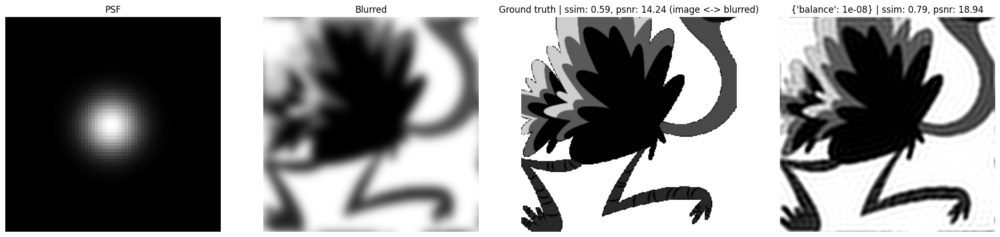

In [49]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/icons_jpg/3/ostrich.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-27.npy',
    is_noised=False,
    discretization='linrgb_float',
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-8}])

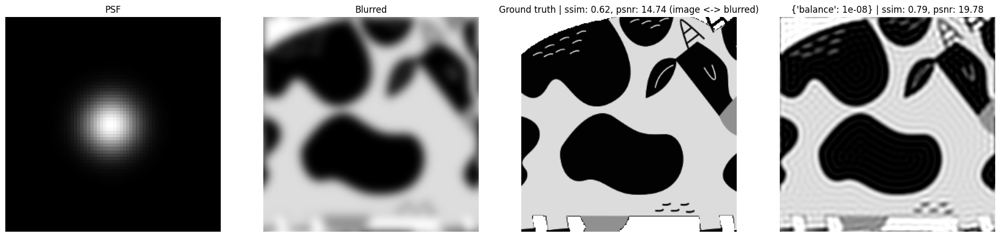

In [50]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/precomp/icons_jpg/1/cow.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-15.npy',
    is_noised=False,
    discretization='linrgb_float',
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-8}])

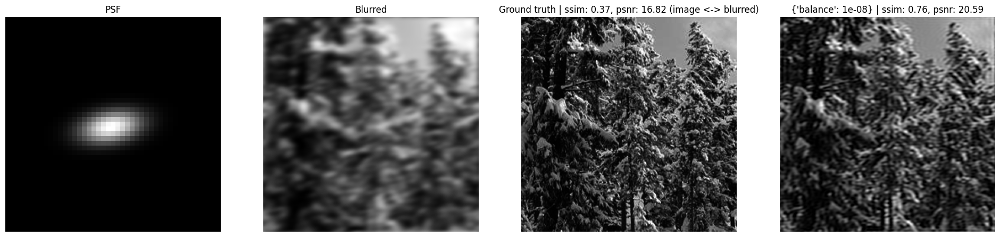

In [51]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_31.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-2.npy',
    is_noised=False,
    discretization='linrgb_float',
)

viz_wiener_diff_params(image, psf, blurred, params=[{'balance': 1e-8}])

## №8 [GPU] Скорость работы и удобство использования

**Скорость работы**:
- Винеровский фильтр выигрывает по скорости работы на процессоре.  
- Нейросети намного более медленные на процессоре (*но стоит учитывать, что используются только torch-веса, без конвертации в другие форматы и/или оптимизации*), но сопоставимые по скорости на видеокартах. 

**Удобство использования**:
- Винеровский фильтр выигрывает и по простоте использования ("из коробки").
- Нейросети требуют обучения и дополнительной предобработки входных изображений. Кроме того, их не так легко сконвертировать в другие форматы (в ONNX не удалось, в TorchScript существенной разницы нет (и еще нужно проверить на корректность))


In [7]:
image, psf, blurred, blurred_3d = get_image_psf(
    image_path='../datasets/gt/Sun-gray/im_10.png',
    psf_path='../datasets/kernels/gauss-blur/processed/synthetic/synthetic-15.npy',
    is_noised=True,
    discretization='linrgb_float'
)

print(f'Image shape: {image.shape}; psf shape: {psf.shape}')

Image shape: (256, 256); psf shape: (66, 66)


1) CPU (torch.nn.Module + pre/post-processing)

In [13]:
wiener = models['wiener']['noise']
dwdn = models['dwdn']['noise']
kerunc = models['kerunc']['noise']
usrnet = models['usrnet']['noise']

In [14]:
%timeit -n 10 -r 3 wiener(blurred, psf)

4.22 ms ± 78.2 µs per loop (mean ± std. dev. of 3 runs, 10 loops each)


In [15]:
%timeit -n 10 -r 3 kerunc(blurred, psf)

2.1 s ± 57 ms per loop (mean ± std. dev. of 3 runs, 10 loops each)


In [16]:
%timeit -n 10 -r 3 dwdn(blurred_3d, psf)

6.07 s ± 64.4 ms per loop (mean ± std. dev. of 3 runs, 10 loops each)


In [17]:
%timeit -n 10 -r 3 usrnet(blurred_3d, psf)

2.52 s ± 16.1 ms per loop (mean ± std. dev. of 3 runs, 10 loops each)


2. CPU (TorchScript без pre/post-процессинга)

In [8]:
dwdn_scripted = torch.jit.load('../models/model_DWDN-scripted.pt')
kerunc_scripted = torch.jit.load('../models/noise_0pp-scripted.pt')
usrnet_scripted = torch.jit.load('../models/usrnet-scripted.pt')

In [9]:
batch_size = 1
num_channels = 1
image_size = 256

y_sample = torch.randn((batch_size, num_channels, image_size, image_size))
psf_sample = torch.randn((batch_size, 1, image_size, image_size))

In [10]:
%timeit -n 10 -r 3 kerunc_scripted(y_sample, psf_sample)

2.13 s ± 13.1 ms per loop (mean ± std. dev. of 3 runs, 10 loops each)


In [11]:
num_channels = 3

y_sample = torch.randn((batch_size, num_channels, image_size, image_size))
psf_sample = torch.randn((batch_size, 1, 41, 41))

In [12]:
%timeit -n 10 -r 3 dwdn_scripted(y_sample, psf_sample)

4.52 s ± 107 ms per loop (mean ± std. dev. of 3 runs, 10 loops each)


In [14]:
sigma = torch.tensor(1).float().view([batch_size, 1, 1, 1])
scale_factor = torch.tensor(1)

In [15]:
%timeit -n 10 -r 3 usrnet_scripted(y_sample, psf_sample, scale_factor, sigma)

2.78 s ± 182 ms per loop (mean ± std. dev. of 3 runs, 10 loops each)


2. GPU

In [ ]:
config_gpu = OmegaConf.load('../configs/config_viz_gpu.yml')
cm = config_gpu.models
cd = config_gpu.dataset

models_gpu = dict()

models_gpu['kerunc'] = dict()
models_gpu['kerunc']['noise'] = KerUncPredictor(**cm.kerunc.noise_params)
models_gpu['kerunc']['no_noise'] = KerUncPredictor(**cm.kerunc.no_noise_params)

models_gpu['usrnet'] = dict()
models_gpu['usrnet']['noise'] = USRNetPredictor(model_path=cm.usrnet.model_path, **cm.usrnet.noise_params)
models_gpu['usrnet']['no_noise'] = USRNetPredictor(model_path=cm.usrnet.model_path, **cm.usrnet.no_noise_params)

models_gpu['dwdn'] = dict()
models_gpu['dwdn']['noise'] = DWDNPredictor(model_path=cm.dwdn.model_path, **cm.dwdn.noise_params)
models_gpu['dwdn']['no_noise'] = DWDNPredictor(model_path=cm.dwdn.model_path, **cm.dwdn.no_noise_params)


In [ ]:
dwdn   = models_gpu['dwdn']['noise']
kerunc = models_gpu['kerunc']['noise']
usrnet = models_gpu['usrnet']['noise']

In [ ]:
%timeit -n 10 -r 3 kerunc(blurred, psf)

In [ ]:
%timeit -n 10 -r 3 dwdn(blurred_3d, psf)

In [ ]:
%timeit -n 10 -r 3 usrnet(blurred_3d, psf)